## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook.

In [1]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
from sklearn.neural_network import ELMRegressor
sns.set()

In [3]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    print(testPredict.flatten())
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [4]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [5]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [2]:
df = pd.read_csv("../../Datasets/Datos_durante_pandemia/data_durante_vol_in.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,VIX,EMV-ID,EPU
0,2020-01-01,1.289946,12.548403,1.89,186.06
1,2020-01-02,0.735046,12.470000,2.84,139.13
2,2020-01-03,0.591834,14.020000,1.33,108.10
3,2020-01-04,1.367154,14.646666,0.00,212.82
4,2020-01-05,1.505321,14.311970,0.86,173.76
...,...,...,...,...,...
913,2022-07-02,0.778572,25.922916,11.11,130.95
914,2022-07-03,0.819483,26.641413,23.06,135.95
915,2022-07-04,0.843804,27.530000,15.98,309.83
916,2022-07-05,0.850985,27.540000,18.90,116.59


---

## Desarrollo del modelo 

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    df_label=df_label[lag:]

    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    


    #make model
    model=ELMRegressor(hidden_layer_sizes=(estimators,), activation='logistic', solver='adam')
    #fit the model with the train data
    history=model.fit(df_train,df_train_y_normalize)
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)

    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeELM":["train"]*len(trainPredict.flatten()),"ELM" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeELM":["test"]*len(testPredict.flatten()),"ELM":testPredict.flatten()}]
    
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[1.0158305  1.05128376 1.04484665 0.94092929 0.93544761 1.38639905
 1.00380011 1.37241803 0.93545655 1.26120631 1.00395197 0.98532059
 0.97065641 0.96979314 0.87992147 0.87534879 0.74990899 0.75449276
 0.79567584 0.71267991 1.05314053 1.17807194 1.28404839 1.10962246
 1.11694025 1.10870423 1.44957273 0.99328246 1.34226871 0.96647363
 1.5296832  1.21370471 1.10475645 1.10278681 0.87251355 0.76838997
 0.87164399 0.89897575 0.90845343 0.81997083 0.81725153 1.60775304
 1.69662225 1.47969363 1.58419968 1.25594411 0.99980155 1.01482068
 1.47478543 1.87896303 1.51749936 2.05764474 1.48093085 1.23177144
 1.63928581 1.42817568 1.48319644 1.17500405 1.64236652 2.1825631
 2.36177848 2.145176   2.8566431  2.29347796 2.13020909 1.70298048
 2.18008515 2.3130425  2.4321263  2.52570582 1.81842697 1.891096
 1.84413284 2.1456803  2.48669641 2.58382964 2.64381539 2.24435756
 2.22408332 2.04440823 2.29422424 2.56892141 2.48703624 2.52919745
 2.72105614 2.25075911

Evaluation metric results:
MSE is : 1.4850195250201281
MAE is : 0.8789629697544409
RMSE is : 1.2186137718818577
MAPE is : 42.85016149243494
Evaluation metric results:
MSE is : 1.2702382642732775
MAE is : 0.8752743181296799
RMSE is : 1.1270484746776765
MAPE is : 42.844375769399


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.96747279 1.07416913 1.00054203 0.86647398 0.87925496 1.42594633
 0.94208296 1.35001678 0.90376319 1.29026672 0.93606063 0.9257296
 0.94708205 0.95095462 0.82981756 0.83819889 0.71482586 0.6753894
 0.74562769 0.64317094 1.07025124 1.17895738 1.29590343 1.1058203
 1.08751292 1.13795964 1.46715995 0.91755613 1.31882773 0.97128295
 1.54534884 1.15854854 1.02251    1.05642566 0.82445013 0.72943005
 0.83412056 0.87321513 0.86992885 0.77655983 0.75338507 1.6664904
 1.70525896 1.38409602 1.56504144 1.25025937 0.94604911 0.98429148
 1.54061448 1.92794668 1.42491496 2.03678586 1.45984762 1.22712528
 1.64544753 1.38709616 1.63580243 1.15678119 1.6406831  2.35860502
 2.48410846 2.14192981 3.17422676 2.32006782 2.21931325 1.79717467
 2.40001803 2.36968649 2.39590747 2.78656102 2.06925587 1.73837508
 1.7094712  2.17968774 2.63252785 2.94510296 3.10967393 2.13157987
 2.169396   1.83463045 2.16251892 2.74284344 2.43563791 2.77877345
 3.24736255 2.09043153 

Evaluation metric results:
MSE is : 1.4703356062843345
MAE is : 0.8735760683240457
RMSE is : 1.212573959098716
MAPE is : 42.12030187829692
Evaluation metric results:
MSE is : 1.2740147455050639
MAE is : 0.8723494199411338
RMSE is : 1.12872261672435
MAPE is : 42.33646364404893


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.944759   1.01349741 0.96449059 0.86480252 0.87690553 1.36826857
 0.96483944 1.3535986  0.90793039 1.24083868 0.92732384 0.93190186
 0.93377843 0.93447919 0.83775787 0.8441121  0.69868385 0.66269099
 0.73141934 0.64503515 1.04394665 1.15330487 1.26840697 1.08399156
 1.08628089 1.14305959 1.44202649 0.93880997 1.27880666 0.93239431
 1.48833169 1.17687417 1.06918661 1.07183855 0.83270661 0.72713917
 0.82655725 0.86572972 0.86939184 0.769574   0.76077247 1.58977907
 1.65117812 1.41551934 1.53772006 1.22027808 0.95571856 0.99616592
 1.4697685  1.80770695 1.40493514 1.92522627 1.39570761 1.20175492
 1.63591356 1.34297867 1.5637133  1.20465862 1.67849176 2.26033813
 2.34002619 2.15242948 2.98682276 2.25545541 2.22978193 1.73498211
 2.25080595 2.35569799 2.50281249 2.57253349 1.9536119  1.85514829
 1.51111837 2.03496832 2.38546099 2.73090723 2.88771132 2.2065055
 2.1938697  1.6710209  1.96226468 2.53770467 2.32827655 2.59756027
 3.06020264 2.080941

Evaluation metric results:
MSE is : 1.4870430832217052
MAE is : 0.8724758250303016
RMSE is : 1.2194437597616814
MAPE is : 41.580831630645505
Evaluation metric results:
MSE is : 1.2671986198935485
MAE is : 0.8695838781065143
RMSE is : 1.1256991693581144
MAPE is : 42.24501061735172


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.95982374 1.04451773 0.99818832 0.87622323 0.88063564 1.39537964
 0.98773677 1.36530404 0.93001605 1.27349529 0.95759608 0.94505011
 0.94572504 0.949455   0.85348155 0.85663764 0.71655616 0.67331619
 0.73346127 0.65097445 1.05603425 1.18055802 1.29454018 1.10746687
 1.08605254 1.14172688 1.47133744 0.96313495 1.2962029  0.95288721
 1.52251922 1.19372023 1.06868863 1.07665739 0.83863813 0.73742386
 0.83541295 0.87610424 0.88214123 0.78374194 0.76246696 1.63603416
 1.71828764 1.42339556 1.55187388 1.24735341 0.97120808 1.00050034
 1.50964216 1.90631795 1.44229102 1.97310643 1.42010901 1.22348055
 1.65424697 1.38966337 1.60404623 1.2212281  1.70273044 2.34801255
 2.47754959 2.23166816 3.18957402 2.34659129 2.27507589 1.75268984
 2.30072609 2.43818411 2.59110545 2.69452314 1.99460832 1.81856707
 1.60172586 2.11200292 2.51353464 2.77205869 3.00646313 2.30419385
 2.25599582 1.80016117 2.12788347 2.6579762  2.42300532 2.66777296
 3.1504764  2.16529

Evaluation metric results:
MSE is : 1.4817002027614001
MAE is : 0.8795307794865478
RMSE is : 1.2172510845184736
MAPE is : 42.69724907405673
Evaluation metric results:
MSE is : 1.2701548002698488
MAE is : 0.8746861829076638
RMSE is : 1.12701144637925
MAPE is : 42.84783256982389


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.90865789 0.99909875 0.93626564 0.82845532 0.8284358  1.37689129
 0.93727755 1.30204561 0.85196146 1.21425135 0.89633632 0.87688888
 0.88474465 0.90472467 0.79501311 0.7882123  0.6459971  0.60605991
 0.69820744 0.59499169 1.01739144 1.14448261 1.24777163 1.03659173
 1.0331857  1.13363495 1.44359251 0.88770533 1.23514356 0.92364474
 1.49165191 1.16048427 1.00825787 1.02289489 0.79508977 0.68482477
 0.78553016 0.84025307 0.832823   0.7256522  0.7083691  1.63649936
 1.69837863 1.34439764 1.47303336 1.19483077 0.91143761 0.93497998
 1.48950564 1.88797714 1.36343918 1.89695833 1.40247107 1.19275721
 1.63824082 1.36276916 1.60888134 1.21664592 1.68490353 2.36738298
 2.5196674  2.20372129 3.20953019 2.35188205 2.24612597 1.77060024
 2.38500357 2.53103223 2.61299963 2.71731247 2.06970799 1.91905864
 1.64217304 2.20488597 2.56012069 2.96446989 3.24653734 2.36302404
 2.27468912 1.83347035 2.1229415  2.71769633 2.48741686 2.79655824
 3.3383168  2.22993

Evaluation metric results:
MSE is : 1.4809263319882264
MAE is : 0.8742319615205406
RMSE is : 1.2169331666070353
MAPE is : 41.88996476261686
Evaluation metric results:
MSE is : 1.2688966491442564
MAE is : 0.8698445689978793
RMSE is : 1.1264531278061491
MAPE is : 42.15880890080898


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.94979502 1.04745116 0.98744764 0.86955309 0.8745527  1.38956288
 0.95114631 1.33220313 0.90604007 1.26402212 0.93600526 0.92453877
 0.93554481 0.94335361 0.83485606 0.84016756 0.71584287 0.67042762
 0.73758296 0.64368461 1.05146985 1.15589198 1.25448377 1.07079838
 1.05208109 1.13633548 1.44534753 0.92143694 1.27570974 0.9366956
 1.48475487 1.16127711 1.03963072 1.05898707 0.83039295 0.73420839
 0.82749357 0.87275272 0.8728562  0.77864764 0.75487633 1.63035818
 1.65923272 1.36060611 1.51825694 1.21706003 0.93598101 0.97375613
 1.49636511 1.84685941 1.36950554 1.91575064 1.37823635 1.17607219
 1.59170517 1.33357786 1.53117118 1.16609998 1.64630824 2.30208844
 2.40958827 2.11096182 3.14781299 2.22394587 2.17362661 1.69660752
 2.25352077 2.38081566 2.49569121 2.61279422 1.88171545 1.82193849
 1.56266565 2.0732227  2.36972124 2.78832858 3.05031052 2.22063829
 2.18899342 1.76288364 2.07133693 2.60914399 2.35778998 2.65077763
 3.24005536 2.059008

Evaluation metric results:
MSE is : 1.4825945521919148
MAE is : 0.873707789401125
RMSE is : 1.217618393500983
MAPE is : 41.931831254318205
Evaluation metric results:
MSE is : 1.267541071345228
MAE is : 0.8676377637483235
RMSE is : 1.1258512651967967
MAPE is : 41.97565409187105


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.93414873 1.0395786  0.96819938 0.83731752 0.85673587 1.39533684
 0.93383153 1.31258013 0.88916042 1.2550252  0.91495949 0.89728858
 0.92674532 0.94044555 0.82516122 0.83021177 0.70646337 0.66209487
 0.73602014 0.64201128 1.05616737 1.15803457 1.24711869 1.05413474
 1.04783341 1.14223341 1.44547567 0.89533181 1.25985014 0.9310142
 1.49174636 1.1486526  1.01213451 1.05497662 0.8332362  0.73280305
 0.82649507 0.8743229  0.86550025 0.76872751 0.74791166 1.64397304
 1.657115   1.31440459 1.49306344 1.20912067 0.92345154 0.96998588
 1.50983982 1.8570819  1.32415054 1.89678984 1.37069452 1.16444531
 1.58677264 1.34185891 1.55143564 1.15028492 1.63485776 2.3446625
 2.43644563 2.08898192 3.14251146 2.21482294 2.15247656 1.70128348
 2.28682056 2.39018917 2.48087948 2.66694983 1.93972865 1.80965385
 1.60494701 2.11055908 2.53513675 2.86201073 3.06505628 2.22808093
 2.21534029 1.78641416 2.12235453 2.68854464 2.37268404 2.66554469
 3.16665623 2.0652150

 1.04763133 1.06836849 1.17488628]
Evaluation metric results:
MSE is : 1.4796273969955656
MAE is : 0.8698543012399365
RMSE is : 1.216399357528425
MAPE is : 41.449371422392105
Evaluation metric results:
MSE is : 1.2674616238824508
MAE is : 0.8664680420294277
RMSE is : 1.1258159813586104
MAPE is : 41.78532117581859


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.95788648 1.05633863 0.98854267 0.8666903  0.86849303 1.42672681
 0.97990209 1.35451855 0.90811356 1.28148319 0.9527093  0.92615221
 0.93736867 0.95600497 0.84296462 0.8400675  0.70350198 0.65265874
 0.73724496 0.6331022  1.06699694 1.19106392 1.28489502 1.06628164
 1.04172378 1.1538517  1.48555286 0.92558654 1.2755787  0.93177097
 1.50806829 1.17951049 1.0348891  1.06405481 0.83187135 0.72285127
 0.81804691 0.87645663 0.87214988 0.76659587 0.73860028 1.68791039
 1.74218516 1.38847552 1.52507802 1.23895149 0.94724523 0.97292553
 1.54082925 1.93070612 1.40109006 1.93375638 1.39654133 1.15721577
 1.59777068 1.32122308 1.47880323 1.11121693 1.62067813 2.35063783
 2.47655673 2.13705213 3.28201287 2.25742942 2.15049623 1.62119552
 2.23481765 2.41921225 2.53030671 2.61623031 1.83073711 1.80943186
 1.57384237 2.06709157 2.4959767  2.894581   3.14676106 2.26495194
 2.17478946 1.78590076 2.12042432 2.72450381 2.42212382 2.71126126
 3.28772985 2.09445

Evaluation metric results:
MSE is : 1.4769697660711119
MAE is : 0.8723915442198533
RMSE is : 1.2153064494484969
MAPE is : 41.79534889696189
Evaluation metric results:
MSE is : 1.276904604121827
MAE is : 0.8709484472748368
RMSE is : 1.1300020372202109
MAPE is : 42.08160923605593


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.9791266  1.05938297 0.99081149 0.89303141 0.90616847 1.38250413
 0.95727512 1.35349124 0.93140489 1.26493439 0.94394732 0.95681526
 0.96178933 0.95108281 0.85141712 0.86525218 0.73350134 0.686749
 0.75570902 0.66308264 1.05626921 1.1525597  1.26732392 1.09916414
 1.0863148  1.1473807  1.42792051 0.95188738 1.2967103  0.95690577
 1.50047129 1.17719984 1.06977417 1.09542709 0.85458285 0.75411848
 0.84631336 0.89078315 0.88848637 0.80428465 0.77897209 1.60829162
 1.63009443 1.3901336  1.54720153 1.22485737 0.97147137 1.01084519
 1.48425316 1.81386519 1.39551008 1.94373188 1.39509625 1.19461858
 1.59980494 1.37483513 1.55298979 1.18403552 1.68618959 2.3265812
 2.38184871 2.12013922 3.13888969 2.23714658 2.21671299 1.7404784
 2.24399615 2.37758917 2.57558363 2.69984384 1.95615434 1.83349655
 1.63067283 2.1415308  2.55615354 2.80333431 3.03724178 2.36715572
 2.34247273 1.84573789 2.15171892 2.69999814 2.42985204 2.7147296
 3.23441087 2.20390814 2

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.91743303 1.02158917 0.93917724 0.8211385  0.8436176  1.39381618
 0.90556316 1.30996028 0.86752712 1.24577228 0.88342342 0.88047404
 0.911155   0.92000439 0.79826828 0.80889384 0.67585524 0.62427899
 0.7094015  0.60634777 1.0435958  1.13695365 1.23049845 1.03797396
 1.03891872 1.1560559  1.44134105 0.8671417  1.26929956 0.92224397
 1.48882224 1.14734717 1.0187664  1.0529037  0.81267949 0.70989784
 0.80592827 0.85845528 0.84611698 0.74414186 0.72733182 1.65274131
 1.63526646 1.29241855 1.50384897 1.19751529 0.90214016 0.96212707
 1.51612512 1.84271622 1.29467272 1.90943423 1.36518278 1.19674458
 1.63037695 1.34874075 1.61792011 1.23492272 1.70722225 2.39310926
 2.47845616 2.14240175 3.34500232 2.26633818 2.24895616 1.78055971
 2.40269865 2.52166243 2.60640632 2.74974968 2.04269496 1.92831291
 1.69490499 2.19479356 2.54886392 3.01554026 3.2927419  2.35230356
 2.36073456 1.87298856 2.14726826 2.73575157 2.4412343  2.81130385
 3.46138552 2.14587

Evaluation metric results:
MSE is : 1.4811021827291737
MAE is : 0.8740701165801786
RMSE is : 1.2170054160640262
MAPE is : 41.949308621482444
Evaluation metric results:
MSE is : 1.2733298148459515
MAE is : 0.871034340632681
RMSE is : 1.128419166287932
MAPE is : 42.2362209931261


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.89182775 0.97509472 0.90104966 0.80020252 0.81748831 1.30533635
 0.88049503 1.26302929 0.85062982 1.17935283 0.85849946 0.86507705
 0.879695   0.87763615 0.77572292 0.78791817 0.65580705 0.60621976
 0.6815582  0.59070141 0.98682104 1.08434993 1.1883673  1.01590094
 1.00107494 1.08992402 1.35124352 0.86395111 1.21882028 0.89165271
 1.41166459 1.10487911 0.98715314 1.01263538 0.7829484  0.68774766
 0.77266915 0.82298212 0.81233319 0.72458022 0.70030946 1.53745456
 1.55324114 1.28344489 1.45171169 1.14487357 0.88907015 0.93422693
 1.42038791 1.74176514 1.28770482 1.83398871 1.31237545 1.17132613
 1.54431536 1.33961211 1.55418079 1.19473082 1.63788546 2.27880422
 2.35485414 2.06936215 3.1886566  2.20507331 2.18670547 1.72004829
 2.24817326 2.38340888 2.53426532 2.69779227 1.92306706 1.78307092
 1.64989166 2.08625045 2.4451343  2.76934129 3.06764357 2.27196708
 2.30099994 1.77290172 2.03511224 2.6019685  2.33415737 2.66147354
 3.28766348 2.10848

<ipython-input-3-72e029a2b199>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


[1.61330868 1.78382664 1.13790688 1.01004085 0.97048958 1.46311566
 1.9750371  1.43831017 1.27793113 1.69661213 1.12448792 0.92970888
 1.29364687 1.2454892  1.06173882 1.17023046 1.11672984 1.04098768
 0.91704367 1.52471845 1.44958087 1.74472138 1.18743517 1.66612537
 1.14044518 1.10479798 0.94898517 0.92183274 0.758811   0.75192257
 1.42538759 1.27630747 1.28592605 1.52822181 1.86554805 1.56472896
 2.111412   1.62592127 1.48986183 1.21308421 1.25999082 0.82570031
 1.88877131 0.8562195  1.69229564 0.81843917 1.27386156 0.90396801
 2.01401279 1.0283208  1.34319519 1.11935492 1.08104005 1.17706915
 1.18229748 1.00550951 0.94027098 1.15679703 1.46025179 1.37021675
 1.34447454 1.48640081 1.58030695 0.84788504 1.53685633 1.46437098
 1.040996   1.3523717  0.98018925 0.88541177 0.84998268 0.72727236
 0.7233208  1.15168862 1.28671541 1.10009002 1.44491277 1.22053337
 1.04025879 1.22403911 0.79786033 0.75896411 1.09123329 1.20823647
 1.27051982 0.74900293 1.16691177 1.17057749 1.2415156  1.5583

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[0.86855291 0.97209178 0.90035028 0.78184367 0.79226369 1.31987943
 0.8961554  1.28076223 0.84736444 1.18853756 0.85995732 0.85139035
 0.86309017 0.87064676 0.76865994 0.7740879  0.63262166 0.57420401
 0.65395487 0.56306847 0.9832095  1.10366644 1.21814804 1.02743157
 0.99650425 1.09086662 1.38474359 0.87579937 1.20396135 0.86453453
 1.42337897 1.11197926 0.96859505 0.99075085 0.76181202 0.66036418
 0.74695246 0.80397237 0.79761795 0.70427471 0.67037241 1.56445148
 1.62587837 1.32819881 1.46637491 1.14881149 0.88331492 0.91807788
 1.43797133 1.8075761  1.32762544 1.86262712 1.32521373 1.13736488
 1.51197765 1.30305079 1.49968369 1.07952524 1.52861285 2.25927639
 2.40681653 2.11362256 3.2882381  2.27638946 2.20661835 1.67238576
 2.20305282 2.33630293 2.49992338 2.701611   1.89035981 1.69553529
 1.4389936  1.91793211 2.37526232 2.75680249 3.13450695 2.25025092
 2.15916302 1.51373118 1.82101986 2.50461271 2.25778813 2.61856303
 3.34728913 2.07775

Evaluation metric results:
MSE is : 1.4965695137438342
MAE is : 0.862837203999409
RMSE is : 1.223343579598076
MAPE is : 39.79299431928307
Evaluation metric results:
MSE is : 1.2834244255994995
MAE is : 0.8633041154579251
RMSE is : 1.1328832356423584
MAPE is : 40.703252475101195


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (273, 1)
len PREDICT:  (273, 1)
[1.16687348 1.27990538 1.15842609 1.03983098 1.09665    1.62217846
 1.08128722 1.51726627 1.10709752 1.48920863 1.09073381 1.11371819
 1.17496794 1.16915847 1.03479361 1.06537884 0.95590201 0.89867629
 0.97718124 0.87220171 1.30042409 1.3396897  1.41053507 1.23963792
 1.25753447 1.37238416 1.62424498 1.05452417 1.48247385 1.14381572
 1.69582154 1.3179106  1.22863022 1.31485955 1.07467585 0.97265053
 1.06793836 1.11037265 1.09236314 1.00416952 0.98798587 1.86507176
 1.74189816 1.41677962 1.71211477 1.40649293 1.12061399 1.21315901
 1.73759774 1.95715574 1.40110294 2.07612587 1.510231   1.33001581
 1.80165024 1.53322083 1.76994585 1.37779637 1.9506294  2.63601163
 2.56143625 2.16481706 3.43543589 2.23997178 2.29144918 1.88621544
 2.48486626 2.52252677 2.70008377 2.89898444 2.08181606 1.96605693
 1.74200799 2.36703966 2.73874926 3.0829322  3.26923559 2.28914807
 2.45135268 2.00161058 2.36916702 2.95338705 2.49600629 2.88325112
 3.5691042  2.08115

Evaluation metric results:
MSE is : 1.5188625524143922
MAE is : 0.9261235770611819
RMSE is : 1.232421418352664
MAPE is : 47.950483133871394
Evaluation metric results:
MSE is : 1.2849323986959775
MAE is : 0.9067749448354282
RMSE is : 1.1335485868263333
MAPE is : 47.15130345864957


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.82379671 0.78359647 0.73622262 1.04949229 0.66856857 1.07418186
 0.785091   1.19178751 0.89899706 0.83503209 0.78743931 0.74028488
 0.65579875 0.67022849 0.59877674 0.60373071 0.63668506 0.49744878
 0.78363708 0.92116956 1.02067156 0.92638316 1.02167417 1.02345052
 1.20723434 0.7275265  1.24875236 0.92630246 1.31227359 0.97840202
 1.00309038 0.99406197 0.73288712 0.64375562 0.72393302 0.74180855
 0.7288275  0.6510533  0.67262572 1.4131425  1.35288928 1.1288161
 1.54992545 1.31856469 0.89883393 0.84746191 1.3278226  1.66182184
 1.28321802 2.03080063 1.53063783 1.11121037 1.39815949 1.1923244
 1.5020644  1.41403962 1.84208442 2.53493655 2.66803545 2.5308973
 2.98833392 2.30637246 2.22000281 1.79865456 2.24538283 2.36153227
 2.49526626 2.65043862 2.24064947 2.1820927  1.51686883 1.9504468
 2.51513606 2.90112554 2.97827214 2.10059037 2.10526418 1.76575433
 2.20113546 2.67059435 2.75953258 2.90582604 3.00174997 2.09801487
 2.39614027 2.27039699 

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.86380096 0.83695831 0.78341994 1.14483272 0.73439783 1.14747021
 0.8784718  1.27282787 0.952815   0.88759211 0.85261076 0.81151793
 0.71230731 0.7283859  0.66692765 0.65003598 0.68743321 0.51972557
 0.8372566  0.98242561 1.08882675 0.99482184 1.0603444  1.09560652
 1.27587819 0.82476896 1.33010136 0.9893449  1.33098564 1.04237806
 1.06518707 1.07742647 0.81876927 0.71942264 0.78699402 0.80552894
 0.78792094 0.71812615 0.72841601 1.51308392 1.41846842 1.19733285
 1.61314678 1.37235545 0.93948018 0.90784747 1.43504049 1.73879876
 1.31675425 2.04290089 1.55603826 1.0852137  1.37480954 1.10238962
 1.46646206 1.24440389 1.72607218 2.50091098 2.67145167 2.41193424
 3.05547818 2.33619809 2.17718709 1.79762891 2.2867012  2.34989901
 2.56638976 2.7173234  2.2882747  2.09717509 1.67215794 2.18231247
 2.44903273 2.97924005 3.12724945 2.24842041 2.1584267  1.98556153
 2.2723654  2.68898858 2.79868963 2.93090007 3.04692153 2.15618721
 2.35071405 2.30918

Evaluation metric results:
MSE is : 1.4406240849064327
MAE is : 0.8704480003024616
RMSE is : 1.2002600072094516
MAPE is : 42.39331429372692
Evaluation metric results:
MSE is : 1.3130965492903488
MAE is : 0.8841534199340496
RMSE is : 1.1459042496170213
MAPE is : 42.99453242399889


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.93751163 0.89947708 0.82310973 1.2149163  0.77421091 1.16779587
 0.90301261 1.32648523 1.0014604  0.91920828 0.8964437  0.87923584
 0.76623832 0.77731735 0.72568971 0.70916746 0.75932862 0.5759312
 0.92365685 1.03678281 1.10845046 1.00867662 1.07881873 1.14696382
 1.31482174 0.83584721 1.3360861  1.04387203 1.3584191  1.08980285
 1.08933762 1.10714994 0.84692839 0.7651699  0.84104814 0.86929276
 0.83978867 0.77416604 0.77226928 1.57761173 1.43573894 1.14546063
 1.61046555 1.40965335 0.97136744 0.93239329 1.49741695 1.77104258
 1.30177384 2.04833329 1.59496135 1.09972356 1.41051516 1.12197751
 1.3630741  1.21811592 1.72343806 2.45584156 2.60945687 2.3970111
 3.21476848 2.2574041  2.05725579 1.65710922 2.14440192 2.26774214
 2.3618344  2.52666608 2.10298274 2.07453953 1.57501605 1.86866391
 2.39325442 3.13843601 3.25066416 2.01621261 1.99882269 1.91015842
 2.2434407  2.82994349 2.83910886 3.03359911 3.13110273 2.06230245
 2.34348594 2.2214128

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.86120385 0.80842181 0.69982479 1.0957661  0.69810654 1.07520389
 0.77733602 1.24363109 0.93925624 0.84107153 0.77052214 0.77424598
 0.68402934 0.67945853 0.6273248  0.6192355  0.67612677 0.48289984
 0.82504901 0.97334598 1.05588525 0.91332479 0.95273109 1.04200667
 1.24604421 0.74621876 1.22824117 0.92675305 1.29763485 1.0040843
 0.98202723 0.96662798 0.74969408 0.68079854 0.74422756 0.78748455
 0.75812866 0.67634774 0.67232744 1.51575061 1.43076148 1.1000939
 1.45286524 1.28041162 0.89371101 0.82569382 1.40607018 1.77857179
 1.28742948 1.93404595 1.46333264 0.99051967 1.27046632 1.01730776
 1.31258292 1.19178724 1.63053255 2.45948811 2.70162063 2.42169998
 3.18716166 2.22698057 1.98353037 1.53141788 2.1192577  2.28615582
 2.32257896 2.44496107 2.15742346 2.0365203  1.4273099  1.8113257
 2.40305643 3.23913576 3.30674814 2.04341519 1.80122256 1.59843299
 2.10616274 2.8149767  2.87057787 3.05345563 3.10641128 1.9323068
 2.26749006 1.90137833 

Evaluation metric results:
MSE is : 1.4248818297163222
MAE is : 0.8570303199845716
RMSE is : 1.1936841415199928
MAPE is : 40.72594391917872
Evaluation metric results:
MSE is : 1.329977555910181
MAE is : 0.8760567559535791
RMSE is : 1.1532465286790075
MAPE is : 41.4120026546122


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.85391004 0.81972428 0.71658849 1.11655088 0.69263847 1.07704724
 0.81147518 1.23036653 0.93083841 0.83231675 0.7986602  0.783777
 0.68026796 0.69007121 0.63965417 0.61872968 0.67500783 0.48096124
 0.83860353 0.97082614 1.04248068 0.92200791 0.97526863 1.05525099
 1.22464582 0.75704383 1.22497946 0.95786947 1.25359589 1.01955573
 0.99242334 1.00505586 0.75449186 0.67164619 0.74992287 0.78581233
 0.75309538 0.68548302 0.67827069 1.50639681 1.39840532 1.07860175
 1.49966929 1.30414666 0.86312006 0.8336047  1.41443567 1.72345857
 1.25416222 1.95345245 1.51415624 0.98859008 1.30608849 1.03074661
 1.28841504 1.16242014 1.61957716 2.42404618 2.66702969 2.43975795
 3.28745412 2.25829419 2.03029686 1.62563584 2.06158877 2.22885095
 2.29513824 2.45298367 2.17474966 2.06196891 1.51297418 1.81533455
 2.41162694 3.35366553 3.43103613 2.07885519 1.96734002 1.72134032
 2.15505443 2.8365994  2.95381615 3.1401362  3.15649936 1.90865691
 2.30212736 2.0261738

Evaluation metric results:
MSE is : 1.421338091791149
MAE is : 0.8569514570074966
RMSE is : 1.1921988474206595
MAPE is : 40.76161588435975
Evaluation metric results:
MSE is : 1.3336335434058177
MAE is : 0.8762836097879168
RMSE is : 1.1548305258373706
MAPE is : 41.37871354356871


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.91647909 0.86660087 0.74541267 1.16219249 0.74879876 1.11629074
 0.86458318 1.30978469 0.99895673 0.87874662 0.83928914 0.85465075
 0.74274335 0.74219986 0.70691459 0.69024186 0.73250932 0.52339092
 0.88685068 1.02819731 1.09541492 0.97316956 1.03641031 1.13578007
 1.29180266 0.81165605 1.26678378 1.00072562 1.3202672  1.0701999
 1.02782493 1.04286018 0.82884122 0.74305684 0.80825662 0.84759828
 0.81156998 0.74304956 0.7333134  1.55437673 1.42451365 1.09789276
 1.5039621  1.35912132 0.95678653 0.89248919 1.48351811 1.77463256
 1.26912436 1.92303175 1.52837675 1.07003148 1.33271643 1.10296743
 1.41183046 1.24001627 1.724642   2.48725043 2.70497534 2.38101998
 3.26405084 2.28140219 2.02972102 1.68279149 2.19638884 2.35983683
 2.46712446 2.62557968 2.24401292 2.19282601 1.71382877 1.96072403
 2.56357131 3.49160112 3.56370088 2.29071888 2.0691193  1.83584332
 2.21822146 2.93290846 2.96407685 3.15362824 3.28342184 2.14067391
 2.3077249  2.230016

Evaluation metric results:
MSE is : 1.4300738613518822
MAE is : 0.8671520355710787
RMSE is : 1.1958569568940436
MAPE is : 41.97227475304886
Evaluation metric results:
MSE is : 1.3135723016537784
MAE is : 0.8773518676379346
RMSE is : 1.146111819000999
MAPE is : 42.22973093534084


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (271, 1)
len PREDICT:  (271, 1)
[1.03453705 1.01490485 0.90923814 1.28209983 0.86815023 1.2780224
 0.9867805  1.4162937  1.10941202 1.03381988 0.98620266 0.96347359
 0.87081684 0.8872893  0.83635729 0.80576911 0.87144496 0.67372728
 1.02604964 1.14825163 1.24001791 1.12037104 1.15121808 1.24061396
 1.39951501 0.93775437 1.41670758 1.12137288 1.43359035 1.19217049
 1.18096645 1.17913246 0.92844438 0.86680684 0.9459473  0.97938428
 0.94818338 0.88343452 0.87150555 1.6834754  1.56457281 1.28283718
 1.65638703 1.43421261 1.05095772 1.02961801 1.58836391 1.88836493
 1.46140066 2.12506378 1.64011807 1.11552971 1.44859474 1.12659161
 1.39437765 1.28955816 1.72849951 2.50797167 2.73773963 2.54955704
 3.45868092 2.34530819 2.11634242 1.69642645 2.15040443 2.29517365
 2.43562398 2.62929421 2.3485271  2.25342434 1.62779483 2.009576
 2.64261937 3.57130518 3.67354956 2.27269539 2.11992347 1.88548498
 2.33829927 3.08600572 3.15629657 3.35111791 3.33234703 2.1448727
 2.4736209  2.22888992 

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.80446532 0.74818941 0.61972373 1.05881746 0.6468988  1.01687141
 0.74617402 1.17954266 0.88266732 0.75916598 0.71395263 0.72037839
 0.60645927 0.60300414 0.55089833 0.53046613 0.58556383 0.37056881
 0.75240792 0.91553398 1.00343313 0.87495551 0.9171119  1.01311776
 1.17826902 0.71007572 1.15787891 0.89692238 1.2449677  1.00091428
 0.91274427 0.91923152 0.70205933 0.60119066 0.67177793 0.72015555
 0.67956522 0.60647408 0.59805041 1.45418562 1.38099203 1.05215862
 1.42596998 1.23430609 0.82767921 0.76661807 1.36936529 1.72110216
 1.23363236 1.88047137 1.45507358 0.99230924 1.28168171 1.05520799
 1.44613048 1.24636415 1.66893932 2.5278096  2.81391544 2.48309684
 3.30854609 2.38721598 2.09629028 1.68622021 2.2516393  2.42200862
 2.49611967 2.69260984 2.39215162 2.11462748 1.50630969 1.95584573
 2.54149888 3.46384549 3.63316489 2.25668533 2.13895434 1.85560693
 2.1669086  2.94258786 3.02060609 3.19972579 3.370893   2.18512502
 2.43331572 2.34920

Evaluation metric results:
MSE is : 1.436808167656123
MAE is : 0.8625136413287405
RMSE is : 1.1986693320745814
MAPE is : 41.10082784602811
Evaluation metric results:
MSE is : 1.3185699998412466
MAE is : 0.8702763439230438
RMSE is : 1.148290032980016
MAPE is : 40.9545358629727


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.84860941 0.82521034 0.72108561 1.09827665 0.66760489 1.08561815
 0.81035272 1.25651702 0.92969434 0.85440078 0.80085273 0.78546203
 0.6739455  0.68487855 0.63707406 0.62127279 0.66980419 0.45529004
 0.8103107  0.9313135  1.02688685 0.92997608 1.00713099 1.09241655
 1.21890587 0.754259   1.25972467 0.97031874 1.30429499 1.03383522
 1.02263823 1.02048636 0.78300064 0.68949956 0.74947687 0.78826455
 0.75135412 0.68392189 0.6884769  1.48467029 1.33653803 1.08192189
 1.5228727  1.3195871  0.91957199 0.86698856 1.40991156 1.69164628
 1.2519555  1.97750705 1.5205732  1.08891265 1.36231633 1.09754746
 1.48722453 1.33192748 1.82306122 2.58582446 2.78556272 2.51181594
 3.39095438 2.36082753 2.1904018  1.77584784 2.28948521 2.41397948
 2.50980353 2.72244835 2.46998036 2.31466563 1.73290569 2.0724307
 2.70914898 3.63783522 3.75633052 2.37679562 2.36359154 2.06296208
 2.50154513 3.20323315 3.27408833 3.46926479 3.43780013 2.28815856
 2.69679097 2.348711

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.87506099 0.82845491 0.73266156 1.15201868 0.73106624 1.14883652
 0.85639784 1.31551445 0.96346229 0.88755157 0.8330602  0.84123693
 0.72471174 0.72724099 0.66917962 0.64403162 0.69063836 0.47917542
 0.85644352 0.99579146 1.1085307  0.98849509 1.05342674 1.13765416
 1.28482529 0.79796207 1.27668898 0.9823683  1.3589531  1.05229445
 1.03028918 1.03334328 0.82545636 0.72539592 0.77173844 0.81038615
 0.77790056 0.70528692 0.69896454 1.52410135 1.40994154 1.15446505
 1.55310437 1.37483438 0.99417329 0.91290176 1.46475639 1.76297614
 1.29817734 1.97230468 1.53385005 1.14280019 1.39265024 1.17553193
 1.55481321 1.30075146 1.7710764  2.55380536 2.81698694 2.50330613
 3.41983017 2.40496506 2.29168601 1.82575133 2.3349119  2.38238559
 2.53911151 2.7977958  2.38423259 2.17718768 1.48436553 1.93398421
 2.47479808 3.32436808 3.59561445 2.21476842 2.17085908 1.81745311
 2.1231324  2.76900382 2.7950587  3.08296058 3.33191125 2.10700385
 2.38574879 2.30127

Evaluation metric results:
MSE is : 1.4427789559816273
MAE is : 0.8744931889855666
RMSE is : 1.2011573402271774
MAPE is : 42.49005982665959
Evaluation metric results:
MSE is : 1.307721803347567
MAE is : 0.8824531842705278
RMSE is : 1.1435566463221518
MAPE is : 42.92184822227948


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.94976531 0.8987746  0.77034572 1.18951943 0.80399719 1.18112913
 0.9050074  1.29930025 1.02131714 0.90872083 0.87201504 0.86568136
 0.76865325 0.77690255 0.71768122 0.68187177 0.73947331 0.53925769
 0.92053756 1.07545512 1.15915934 1.02610068 1.0344734  1.12150526
 1.30093597 0.85711722 1.27417231 1.00405446 1.32743577 1.1344542
 1.05857963 1.04848692 0.82373643 0.75748657 0.8312606  0.87198805
 0.83885375 0.77196226 0.7475618  1.57905383 1.516117   1.21411789
 1.54404395 1.32212034 0.93290367 0.9136276  1.49652581 1.82575088
 1.36371494 1.95080499 1.4922404  1.06011518 1.3796034  1.15242722
 1.52840072 1.39000263 1.78537024 2.60969492 2.92681259 2.63635422
 3.47466663 2.39171934 2.12281373 1.72975385 2.19899673 2.44125725
 2.58371542 2.74748883 2.3291869  2.1660719  1.48559384 1.85606486
 2.42892675 3.37600567 3.83120919 2.35154739 2.25704878 1.83002361
 2.06449358 2.86654745 2.98962929 3.29371343 3.54142016 2.21346429
 2.45395515 2.399444

Evaluation metric results:
MSE is : 1.452298277239952
MAE is : 0.8912860412713272
RMSE is : 1.2051133877108626
MAPE is : 44.56228215219763
Evaluation metric results:
MSE is : 1.301459073723171
MAE is : 0.8821456550792237
RMSE is : 1.1408150918195161
MAPE is : 43.351780603002446


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.80194823 0.7093601  0.59959963 1.05119945 0.64915736 0.99302106
 0.7309345  1.22320973 0.88252369 0.75570471 0.69874053 0.73859966
 0.60495694 0.57726572 0.53485879 0.51812129 0.54842131 0.3393836
 0.70915646 0.87888143 0.97723379 0.85808368 0.92241665 1.05051854
 1.19857525 0.68695531 1.1425229  0.89548933 1.29484381 0.99276505
 0.91316934 0.89964166 0.72491399 0.60823723 0.63111912 0.69101533
 0.65446666 0.57194158 0.56710587 1.41554202 1.35402436 1.01393008
 1.40730602 1.31282806 0.91952377 0.78281677 1.36994545 1.72890316
 1.2030496  1.84683213 1.48394362 1.1580642  1.31718293 1.15589264
 1.58389099 1.3818404  1.78317284 2.58872786 2.89510798 2.52262248
 3.43189538 2.49468954 2.31125679 1.87592195 2.51541282 2.63808268
 2.62751386 2.82715767 2.58128806 2.29321571 1.65446445 1.98009789
 2.62714388 3.51360703 3.85819427 2.426309   2.39052833 2.09714606
 2.37044854 2.96551776 2.97585915 3.25520833 3.62909335 2.3522967
 2.70069147 2.5556046

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (271, 1)
len PREDICT:  (271, 1)
[0.83053904 0.73158719 0.57769682 1.06901622 0.62312183 0.9759804
 0.73297488 1.2151249  0.89241227 0.72820795 0.69161632 0.72606949
 0.59889756 0.59930011 0.58227651 0.54128958 0.59874761 0.36636164
 0.7770724  0.94157792 0.9998237  0.86028886 0.86882509 1.03706629
 1.21136617 0.6767219  1.16009194 0.8644049  1.24157347 1.03198038
 0.86981863 0.85992563 0.69763346 0.61073489 0.67556129 0.75163746
 0.70873375 0.6182642  0.59962652 1.50244251 1.39554041 0.94577087
 1.36410427 1.1961948  0.77392888 0.74922208 1.41692422 1.76795982
 1.17269177 1.80331855 1.35958681 0.94854564 1.24742727 1.03799192
 1.57675527 1.31656401 1.76894774 2.65915946 2.94839256 2.42545957
 3.39526716 2.26283863 1.95436885 1.65226641 2.36301128 2.59896652
 2.54821033 2.66186524 2.42131045 2.08638903 1.59540514 1.84957918
 2.49718453 3.85956673 3.96401114 2.38383383 2.21616286 1.91658064
 2.08746428 3.01167881 3.01928333 3.27021327 3.64064924 2.13752289
 2.53296497 2.306392

Evaluation metric results:
MSE is : 1.4482409563975982
MAE is : 0.8695284887030581
RMSE is : 1.203428833125415
MAPE is : 41.632208206245416
Evaluation metric results:
MSE is : 1.3193678280963919
MAE is : 0.8669728293685988
RMSE is : 1.1486373788521735
MAPE is : 40.674826879371224


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.91941448 1.2528     0.76974025 1.31272384 1.01382655 1.33129149
 1.16084258 1.12550648 1.03125719 0.87367337 0.77304828 0.89137011
 0.77190425 0.75070668 0.80066034 0.65121966 0.92995916 0.94795295
 1.16940048 1.10173458 1.14501555 1.17979177 1.46163594 1.0908361
 1.43187423 1.29580977 1.42395022 1.26818233 1.23779379 1.21846312
 0.79692087 0.85179574 0.9441028  0.84413157 0.85252607 0.84772997
 0.78271015 1.56313051 1.51474447 1.34784742 1.70443871 1.45566453
 1.0748875  1.19648865 1.62464886 1.77802306 1.53017104 2.21024896
 1.6980294  1.17717483 1.60737313 1.14762375 1.55225078 1.56199791
 1.78341885 2.28554814 2.71523688 2.54345006 2.85001895 1.94986097
 1.94105248 2.00897289 2.28954321 2.64044852 2.61733906 2.67600554
 2.41471191 2.07506484 1.67269956 1.68346153 2.72528963 3.00869937
 3.19996001 2.30412989 1.88743362 2.11402998 2.27432266 2.93896317
 2.74583511 2.97475887 2.72404134 1.78030062 2.34702208 2.36289783
 1.76411484 2.453511

Evaluation metric results:
MSE is : 1.3966077310510763
MAE is : 0.8523332581185821
RMSE is : 1.1817815919411998
MAPE is : 41.27201321763403
Evaluation metric results:
MSE is : 1.2976745320601608
MAE is : 0.8856883429865934
RMSE is : 1.139155183484744
MAPE is : 43.886975216781856


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.8703766  1.26923484 0.71291072 1.31968429 0.9338372  1.3551131
 1.13813486 1.11669411 0.97454274 0.8496018  0.74781374 0.87294458
 0.71887395 0.67492712 0.77435897 0.57923748 0.89391318 0.88747953
 1.14295337 1.01543183 1.07336874 1.19157762 1.49037006 1.04077756
 1.39522323 1.23896548 1.42915743 1.26035915 1.20482665 1.19628032
 0.74893094 0.83784487 0.90432281 0.8107794  0.78885278 0.78800698
 0.69098008 1.62318846 1.48242238 1.27166894 1.61031714 1.44755504
 1.09163808 1.20437323 1.64314603 1.80061825 1.4754528  2.16777283
 1.65051044 1.19512819 1.62271513 1.15516062 1.52420163 1.59048634
 1.84058415 2.38119272 2.7827521  2.57904591 3.04462468 1.81438248
 2.11421387 2.08029695 2.4380051  2.68466801 2.84821825 2.91539695
 2.25928162 2.24546561 1.60020191 1.64531664 2.81629576 3.2243771
 3.3453532  2.18608136 1.77290249 2.03686341 2.37952716 2.99807337
 2.96291633 3.17074681 2.77817649 1.73848688 2.44472751 2.57449549
 1.93456199 2.7080679

Evaluation metric results:
MSE is : 1.3820589973576685
MAE is : 0.8497895760370356
RMSE is : 1.1756100532734775
MAPE is : 41.18170917891704
Evaluation metric results:
MSE is : 1.3076863166003334
MAE is : 0.8896064473201766
RMSE is : 1.1435411302617555
MAPE is : 43.97561918225596


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.79395853 1.18754243 0.61825204 1.26572409 0.90180548 1.3243447
 1.07917854 1.04994793 0.91910568 0.79416334 0.68519758 0.81647966
 0.68793907 0.66371213 0.74995812 0.54018693 0.86983573 0.8602219
 1.12005378 1.00216817 1.05268882 1.14117087 1.39210971 0.98135722
 1.36631654 1.22549417 1.36626779 1.19876367 1.1367725  1.14915221
 0.73109044 0.82354633 0.89146089 0.79925582 0.76974229 0.76836351
 0.67379285 1.5686535  1.39189538 1.22548808 1.59463573 1.39757422
 1.01827018 1.12288287 1.58759689 1.71467396 1.44525702 2.14820804
 1.59286807 1.12108113 1.6028312  1.18449895 1.60317902 1.6023265
 1.81348175 2.46976411 2.84870854 2.60495797 3.03589062 1.89492087
 2.13090153 2.05108639 2.36920091 2.65800794 2.72944783 2.84148176
 2.30306389 2.13987519 1.37681268 1.51125892 2.76914297 3.4228704
 3.4234275  1.88706722 1.57620808 1.83433523 2.23979643 2.95559468
 2.85216388 3.13091698 2.65042144 1.61990394 2.2592707  2.15599749
 1.73963957 2.46480773 

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.83744248 1.23020902 0.73880254 1.32886908 0.9427358  1.35360054
 1.11052539 1.06792439 0.92028584 0.83246077 0.74656859 0.85812901
 0.72016654 0.6839852  0.77117947 0.58296406 0.92347474 0.95756884
 1.21003636 1.04610917 1.05934733 1.146261   1.4423771  1.01551263
 1.36217978 1.24235116 1.41680669 1.24371427 1.19478878 1.14829892
 0.75816845 0.86036498 0.93587335 0.8498534  0.83569549 0.8129069
 0.71842563 1.61824254 1.54230191 1.31646832 1.57595582 1.41222605
 1.02025029 1.10373029 1.61202076 1.82743556 1.5171865  2.1133414
 1.59796007 1.14065143 1.60258574 1.16867008 1.61461536 1.62558615
 1.85801331 2.49494151 2.90132791 2.69998123 3.19223744 1.98544645
 2.1759988  2.06929443 2.38479422 2.68432584 2.88039229 2.90555851
 2.41348695 2.31857944 1.56381413 1.61487327 2.87597111 3.61637684
 3.76677637 2.28875104 1.74530385 2.00366817 2.39536829 3.22055931
 3.15088054 3.51112909 2.98855717 1.78999429 2.40889372 2.52753703
 1.85277335 2.6300009

Evaluation metric results:
MSE is : 1.3855740373924506
MAE is : 0.8580906814527827
RMSE is : 1.1771040894468299
MAPE is : 42.19133950370786
Evaluation metric results:
MSE is : 1.3080696078016727
MAE is : 0.8953201645200013
RMSE is : 1.143708707583217
MAPE is : 44.88271777276723


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.8401659  1.21755694 0.68266847 1.24209022 0.90493725 1.31190773
 1.09065981 1.04876657 0.9402074  0.82697829 0.7176424  0.82261913
 0.70181803 0.66761442 0.74388268 0.55134063 0.87208224 0.86217823
 1.09716188 0.99544264 1.03768265 1.14906406 1.40235886 0.98819891
 1.32312884 1.21010985 1.37667419 1.22233305 1.16419943 1.14738086
 0.72451581 0.81015593 0.86747818 0.77588612 0.76613346 0.7772613
 0.68293665 1.53214039 1.39491751 1.18580014 1.5240238  1.38532486
 1.0566373  1.13875215 1.57894277 1.72665072 1.41125788 2.07563376
 1.59972992 1.21142096 1.59478271 1.10422234 1.57883866 1.58261947
 1.7576419  2.33336329 2.73097424 2.49556255 2.92126053 1.80355701
 1.98031565 1.94202658 2.37566086 2.67368589 2.775339   2.93717123
 2.50709941 2.22725098 1.58942127 1.73563006 2.88908845 3.51747248
 3.7564216  2.10193442 1.67624112 2.03154465 2.35507439 3.25183831
 3.13101419 3.34060812 2.73938653 1.74243375 2.37409863 2.47002007
 1.87617908 2.732287

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.82625921 1.24332139 0.68323628 1.346374   0.91278022 1.38976699
 1.11252356 1.07942436 0.91266026 0.81685564 0.72392672 0.84736015
 0.70540233 0.67123248 0.75811399 0.55355092 0.91295216 0.92409069
 1.21554509 1.03631089 1.05293849 1.16163378 1.46187827 0.99268013
 1.37995751 1.24340896 1.41935164 1.22553907 1.16611661 1.14900771
 0.72562129 0.82773778 0.88467714 0.81173831 0.81486997 0.79193216
 0.68418427 1.64283617 1.54023208 1.3017262  1.58749179 1.4293508
 1.04516641 1.10289498 1.61945219 1.86515153 1.53804249 2.17752702
 1.62193929 1.17128159 1.57730329 1.09127604 1.5738166  1.4943977
 1.82168031 2.41568133 2.90306321 2.67683776 3.30675697 1.97485578
 2.12899668 1.96523292 2.35702748 2.66907629 2.8551023  2.96008827
 2.32937384 2.25319643 1.67412149 1.65648542 2.8892425  3.66957349
 3.83251011 2.27462784 1.68699983 1.91681621 2.39438268 3.23959995
 3.13562277 3.47841368 2.88891269 1.71987828 2.37693008 2.25619922
 1.85974559 2.6951619

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.93434565 1.36342343 0.78615625 1.38678253 1.02413782 1.48373061
 1.19767651 1.17451573 1.03537491 0.95340029 0.81842905 0.94220741
 0.81960571 0.77238815 0.85855044 0.65406744 1.00329032 0.99837109
 1.2546492  1.09652662 1.14089722 1.27619092 1.54381968 1.09198439
 1.44839797 1.33107208 1.49119551 1.31950438 1.27226399 1.24006371
 0.84789951 0.92269249 0.9901433  0.90958718 0.88525113 0.87839385
 0.78184514 1.71034809 1.57644149 1.30781932 1.6490407  1.53514447
 1.14167629 1.22687673 1.75993717 1.90427611 1.52433261 2.17757411
 1.69922074 1.25555886 1.66761767 1.20486372 1.64850707 1.5556118
 1.81600512 2.40683557 2.88650017 2.54130402 3.08059668 1.89406583
 2.04426297 1.94696064 2.4010095  2.73339978 2.87241071 2.87935071
 2.39458643 2.11687502 1.51618315 1.56181292 2.73597366 3.54653658
 3.78392434 2.01143166 1.63662715 2.02695865 2.33771567 3.16490036
 3.02827368 3.33207552 2.77852268 1.64755533 2.37532988 2.45261673
 1.81349444 2.591869

Evaluation metric results:
MSE is : 1.3880692990720043
MAE is : 0.8611653708354976
RMSE is : 1.1781635281538825
MAPE is : 42.41041007039985
Evaluation metric results:
MSE is : 1.3094422897544225
MAE is : 0.8963446809601846
RMSE is : 1.1443086514373744
MAPE is : 45.092445306402595


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.79219949 1.20045627 0.60819272 1.22299684 0.88845115 1.31976212
 1.0339125  0.99653855 0.89174171 0.79122561 0.65229295 0.79373855
 0.68222363 0.64420517 0.70972703 0.52017212 0.86559506 0.85543772
 1.09849695 0.96828432 1.0243244  1.11740743 1.38554451 0.92322044
 1.33800931 1.22350277 1.3382071  1.15385543 1.1164868  1.14061184
 0.7066721  0.77366914 0.86816025 0.78045113 0.75966814 0.75179238
 0.66251491 1.56300437 1.397982   1.14619009 1.52329535 1.39445772
 0.94151141 1.04906596 1.5873569  1.72730521 1.35556027 2.07407172
 1.58461917 1.08882874 1.53852412 1.10284708 1.50380693 1.56871423
 1.80382559 2.3556032  2.78319597 2.47540541 3.14663132 1.81564059
 1.97388455 1.91854424 2.3445506  2.65527785 2.82267412 2.90786281
 2.37442013 2.26783177 1.70095129 1.67636534 2.95978672 3.71500811
 3.76431665 2.22621614 1.69445877 2.13918856 2.46774865 3.33651627
 3.16324816 3.36081277 2.83545587 1.63478499 2.36042112 2.47113377
 1.87862831 2.68415

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.80253423 1.14426631 0.60572064 1.2376323  0.89334736 1.27195723
 1.03817971 1.00166123 0.8735763  0.75107042 0.65573639 0.79728499
 0.65917719 0.61758433 0.69129062 0.50267684 0.81587276 0.8083896
 1.08381126 0.96165421 1.00247276 1.06228803 1.31954138 0.90469945
 1.2726181  1.21083956 1.29302296 1.1566075  1.10743139 1.11233433
 0.67196919 0.77100221 0.86101517 0.74752779 0.73499035 0.72237413
 0.63832404 1.48181741 1.36177845 1.1772696  1.51602597 1.36631479
 0.94742406 1.06647306 1.51490278 1.66784382 1.4106743  2.05406704
 1.56309667 1.07692406 1.55354406 0.99996299 1.48084599 1.52270447
 1.78470599 2.2472375  2.71808035 2.52693437 3.02755167 1.80085997
 1.96212413 1.95962057 2.28558858 2.60586115 2.77907595 2.88445345
 2.45152573 2.22139338 1.66308555 1.67117637 2.97409655 3.77785044
 3.80415005 2.0293919  1.60744381 2.07055122 2.51224997 3.36034863
 3.2948151  3.59992291 2.85999367 1.69182936 2.5032566  2.51095626
 1.87111592 2.785115

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.82935939 1.23146848 0.72009    1.26499521 0.93823384 1.37697618
 1.11862588 1.08943849 0.95902687 0.88630648 0.74812204 0.85163248
 0.74200049 0.70290464 0.77370873 0.57962207 0.91082331 0.925249
 1.15466841 1.02871684 1.06453152 1.17724753 1.41673001 1.00133928
 1.34844212 1.23078551 1.42241104 1.21011859 1.17836443 1.11308953
 0.77060465 0.85452479 0.92003076 0.83953675 0.79997111 0.8004925
 0.70239146 1.57879616 1.46885482 1.22915488 1.54114445 1.43690781
 1.07998347 1.1354772  1.65530198 1.80188261 1.43031984 2.05369126
 1.60818064 1.2320337  1.53273208 1.23683762 1.60036918 1.60487778
 1.76252667 2.3281235  2.85656337 2.56543142 3.11667367 1.90806528
 2.07541967 1.96763176 2.40047191 2.65376396 2.81491502 2.91538919
 2.40467444 2.22739456 1.49680049 1.47119827 2.71830857 3.49049987
 3.8462477  2.04409693 1.73317087 2.06778409 2.30743301 3.22502316
 3.04168884 3.27334781 2.80943078 1.63543814 2.33205525 2.50658473
 1.73416006 2.51810358

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.94944951 1.36322356 0.83039628 1.35985805 1.05645186 1.53361726
 1.25164657 1.1642199  1.04541846 0.99476705 0.86187422 0.94559924
 0.8623203  0.8414706  0.89934701 0.68144886 1.01964795 1.0518913
 1.29702099 1.15057319 1.20195581 1.31968894 1.53092585 1.06599678
 1.42975228 1.35917057 1.52680215 1.31068106 1.22435023 1.22642869
 0.88827082 0.93527742 0.97214861 0.94268227 0.93447746 0.91027891
 0.82393021 1.71484299 1.59373377 1.32058598 1.64767653 1.60864316
 1.20269352 1.15936347 1.69194188 1.91786272 1.54034636 2.13942166
 1.75188165 1.31198758 1.57716117 1.24065303 1.68126953 1.63333357
 1.85621034 2.4086541  2.8886205  2.48688822 3.09981157 1.97373882
 2.08979837 1.92662751 2.36296502 2.70386421 2.78082611 2.82741422
 2.38120053 2.20260325 1.4185269  1.51124244 2.7903245  3.5734517
 3.81919852 2.12905046 1.76268572 2.13217318 2.38079924 3.19200211
 2.94198389 3.27878552 2.91707121 1.72728589 2.36302487 2.59400847
 1.7427173  2.5328403

Evaluation metric results:
MSE is : 1.4036970452561743
MAE is : 0.8715352716538056
RMSE is : 1.1847772133427341
MAPE is : 43.376822688152956
Evaluation metric results:
MSE is : 1.2987303393503469
MAE is : 0.8934377137701918
RMSE is : 1.1396185060582102
MAPE is : 45.02099408504317


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.89197352 1.24730612 0.66694884 1.31906196 0.97062532 1.42605676
 1.10412927 1.11996988 0.983456   0.88621596 0.76128303 0.90699988
 0.79132318 0.74191575 0.80871814 0.61073907 0.9322564  0.91136985
 1.15994849 1.02307703 1.0713113  1.19100656 1.41356211 0.93850735
 1.41185187 1.22704686 1.39546216 1.180402   1.18959482 1.1340264
 0.79556011 0.89820229 0.95735931 0.87532437 0.83294043 0.80748082
 0.73397336 1.60711745 1.39070271 1.16867501 1.58352962 1.43532429
 1.05797155 1.18601512 1.67198054 1.74029033 1.36302573 2.0718815
 1.5183848  1.2029085  1.54547683 1.1853059  1.67641618 1.60209031
 1.81980053 2.33237556 2.73876136 2.41777515 3.09757857 1.74915459
 2.02121841 1.96015745 2.4352941  2.64392347 2.78985775 2.81165105
 2.2773111  2.17706479 1.5901702  1.47063804 2.51351365 3.46561541
 3.77930843 1.9388645  1.85700283 2.11772764 2.25766305 3.15304471
 2.96132893 3.28105418 2.7971564  1.5201822  2.47661061 2.52959778
 1.59649477 2.6814835

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (269, 1)
len PREDICT:  (269, 1)
[0.92715185 1.29678402 0.80281933 1.36170665 1.04309158 1.47216684
 1.22606589 1.18066831 1.04519654 0.9682412  0.85591686 0.96371555
 0.84829095 0.81656351 0.88589947 0.68508258 0.9982423  1.02189003
 1.25210448 1.11064428 1.15214398 1.24930502 1.48370977 1.03700432
 1.42411152 1.29127905 1.47024597 1.27290863 1.21295764 1.16816577
 0.86911133 0.95403494 1.02436017 0.94042844 0.90878883 0.874387
 0.80833545 1.65768127 1.54298229 1.2885864  1.6180839  1.51513607
 1.16417213 1.23085206 1.69912475 1.85816503 1.48800496 2.08649593
 1.61579314 1.22128315 1.55610433 1.18170681 1.62469442 1.55580251
 1.76758493 2.27137778 2.81735853 2.52665898 3.13516456 1.86591862
 2.01337589 1.90804853 2.30941989 2.58815822 2.73146988 2.72275618
 2.27196791 2.12487148 1.23724356 1.22288632 2.43657394 3.3349565
 3.65967058 1.89470655 1.6392922  1.85745118 2.020029   2.97545041
 2.77555185 3.0900126  2.74246227 1.4611452  2.16929129 2.47203698
 1.37995181 2.42762691

Evaluation metric results:
MSE is : 1.4104647884033257
MAE is : 0.8648343341188834
RMSE is : 1.1876299038014013
MAPE is : 42.222516401182006
Evaluation metric results:
MSE is : 1.2898653441504384
MAE is : 0.8845571259916759
RMSE is : 1.1357223886806311
MAPE is : 44.04968219556636


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.24410482 0.73852806 1.29356159 0.99134843 1.32829672 1.08116083
 1.01445942 1.1779487  0.88198984 0.80881071 0.81925455 0.80023114
 0.70817437 0.69125509 0.59089098 0.94673764 0.92379217 1.12843449
 1.03504641 1.01331374 1.09038104 1.37052098 1.12100364 1.49582829
 1.30728007 1.38929929 1.29485612 1.20540728 1.30710772 0.69154583
 0.84662446 0.86887386 0.90945401 0.84689651 0.751671   0.66614034
 1.48790117 1.43052341 1.35424994 1.61820726 1.334993   0.97750536
 1.17015908 1.77206167 2.0181634  1.56797861 2.12723574 1.628413
 1.18631051 1.64704935 1.44112656 1.97597465 1.71846245 1.83620834
 2.41564125 2.5448893  2.49733577 2.75694454 1.9547879  2.00260275
 1.95699123 2.40408572 2.74105711 2.67411934 2.85793476 2.35574399
 2.05388235 1.40470773 1.8498278  2.44096096 2.94682913 2.90824213
 1.94418038 1.88412398 1.67130599 2.16975527 2.65993124 2.73269285
 3.00625057 2.48693353 1.5339094  2.14099811 2.16144268 1.65563946
 2.39956054 2.4850458

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.29560802 0.71636474 1.30553596 0.96563684 1.38524465 1.10524986
 1.01547417 1.14214199 0.88194995 0.81600645 0.82543366 0.81305782
 0.74594889 0.75424376 0.58178087 0.9809432  0.94193792 1.15845295
 1.0202431  1.00707258 1.13520951 1.39455791 1.09074994 1.53899084
 1.35207139 1.39213633 1.26643575 1.17112104 1.37285089 0.74326037
 0.87984363 0.88338652 0.93149325 0.86584992 0.77408137 0.69688223
 1.60021614 1.43644513 1.28223493 1.61696758 1.33656023 0.99508665
 1.1249679  1.78820364 2.05783205 1.54469237 2.19708545 1.63415681
 1.20539805 1.6293175  1.27536815 1.95700365 1.69092929 1.89776758
 2.58562299 2.81174562 2.72115863 3.0046188  1.91332685 1.99610362
 1.95904638 2.40891591 2.94997325 2.79887663 3.14658131 2.4841877
 2.19663339 1.57121836 1.98634973 2.83079031 3.22144841 3.37862235
 2.07510646 2.00237162 1.68712604 2.2844621  2.86363675 2.91460145
 3.2876194  2.66066313 1.52442096 2.07762687 2.33263911 1.77659972
 2.69254111 2.626667

Evaluation metric results:
MSE is : 1.373960941901589
MAE is : 0.8533744884468611
RMSE is : 1.1721608003604236
MAPE is : 41.4562986870863
Evaluation metric results:
MSE is : 1.3034996998026318
MAE is : 0.8920719843424412
RMSE is : 1.1417091134797128
MAPE is : 44.68080061567496


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.2837314  0.7149934  1.29853197 0.99646521 1.36543297 1.10014496
 1.0014985  1.13947034 0.865576   0.81015578 0.83715145 0.84632957
 0.7573506  0.74845394 0.59279305 0.98220692 0.93430237 1.14883552
 1.00011474 0.97382643 1.0824796  1.4044505  1.13135159 1.54466296
 1.36472204 1.32013953 1.24948953 1.1900563  1.39487678 0.75454382
 0.87199554 0.86054518 0.91511022 0.85980158 0.75695684 0.68490613
 1.56062593 1.44570158 1.2633476  1.564978   1.27047956 0.93025855
 1.12068912 1.83648439 2.13223567 1.57517491 2.18347238 1.60415136
 1.13753713 1.64376331 1.31093691 1.95402045 1.65926976 2.01445642
 2.64323196 2.80144846 2.69074968 3.02557712 1.89225438 1.77370427
 1.83912229 2.30935131 2.82481155 2.89111677 3.17658296 2.27587751
 1.95459931 1.49854435 1.70673807 2.97230744 3.59310996 3.32692244
 1.84908202 1.66019898 1.74636666 2.14875022 2.92375415 3.15564383
 3.47745774 2.57992748 1.40991658 2.12310855 2.03032583 1.77047181
 2.85240245 2.81586

Evaluation metric results:
MSE is : 1.3455210936243338
MAE is : 0.8408069498549207
RMSE is : 1.1599659881325546
MAPE is : 40.197137022155566
Evaluation metric results:
MSE is : 1.3202634541307992
MAE is : 0.8885223629625467
RMSE is : 1.1490271772811986
MAPE is : 43.876481564763175


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.33655397 0.7161101  1.24590983 0.97613083 1.43835292 1.11183894
 0.9646771  1.14779541 0.9211441  0.82055853 0.79985317 0.86759083
 0.79984871 0.77187837 0.59958123 1.00971859 0.95582445 1.14043438
 0.9677925  0.96158834 1.12162891 1.36924807 1.07516384 1.49949438
 1.38081793 1.36202498 1.21483806 1.13506685 1.39339272 0.77180487
 0.87797662 0.84658554 0.95980197 0.89024593 0.77352493 0.69855676
 1.62147999 1.44990891 1.22051225 1.49428187 1.36132828 0.9805259
 0.98875598 1.82407572 2.15613909 1.52291631 2.08280202 1.64577967
 1.1442848  1.50087228 1.20445359 1.87290592 1.58865568 1.84396472
 2.56308612 2.70849305 2.65520308 2.92492775 1.73430263 1.66327212
 1.72360804 2.19673089 2.69854614 2.57436269 2.95756323 2.34498247
 2.04557295 1.34605419 1.6527715  3.01510586 3.49393461 3.49082568
 1.68443834 1.47633592 1.84208075 2.30453487 3.04259324 3.2175816
 3.55124852 2.61320645 1.30708599 1.96016983 2.02609389 1.8240173
 2.61663213 2.8074078 

Evaluation metric results:
MSE is : 1.3480713569142158
MAE is : 0.840819216756272
RMSE is : 1.1610647513873702
MAPE is : 40.09121948367193
Evaluation metric results:
MSE is : 1.32690516143962
MAE is : 0.8888826591850835
RMSE is : 1.151913695308646
MAPE is : 43.53371655172329


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.3211432  0.71226551 1.27397884 0.98110823 1.41226932 1.12724317
 0.98696729 1.12254665 0.88745266 0.80983019 0.82887168 0.84431742
 0.77714484 0.7675353  0.58154889 0.98347801 0.93363514 1.12619924
 0.98064334 0.9974091  1.15559439 1.40030938 1.06653678 1.51970581
 1.39189766 1.38651437 1.2746732  1.15229194 1.36974826 0.78633272
 0.9051357  0.89699406 0.94912815 0.87852069 0.76365109 0.69978925
 1.62011104 1.43583725 1.18275073 1.54227211 1.37922864 0.98254652
 1.10362508 1.81580013 2.0890267  1.48158    2.11347188 1.66220653
 1.20143183 1.6462599  1.22045387 1.88920113 1.69712171 1.9416859
 2.56247537 2.73562548 2.64338747 2.98952146 1.76445751 1.73419943
 1.84111125 2.42086572 2.98986739 2.87534035 3.11863492 2.47629424
 2.24736869 1.71687156 1.81858074 3.1497302  3.80702669 3.62837671
 1.8919313  1.66144557 1.78333797 2.34900576 3.12067146 3.25901361
 3.66012646 2.71693648 1.41125118 2.20177023 2.13824568 1.90536693
 2.78049162 2.798341

Evaluation metric results:
MSE is : 1.3442998588115562
MAE is : 0.8467681295379497
RMSE is : 1.1594394588815564
MAPE is : 41.19286384599376
Evaluation metric results:
MSE is : 1.313243621894263
MAE is : 0.8887304050156644
RMSE is : 1.145968420984742
MAPE is : 44.00943585532573


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.21896556 0.60324132 1.21398735 0.93261394 1.36761527 1.04377921
 0.94207412 1.08088412 0.83252315 0.73642925 0.75830781 0.79834927
 0.71877031 0.70214773 0.52120409 0.92732342 0.8705286  1.10142654
 0.94914269 0.94692171 1.06475168 1.28789364 1.0138649  1.47480058
 1.34735128 1.30618809 1.17154237 1.1181649  1.32027123 0.68295972
 0.84608042 0.85020164 0.92967348 0.84845295 0.73421961 0.63970522
 1.53907308 1.35118391 1.20791273 1.53227516 1.33343448 0.88884682
 0.96209715 1.74821586 2.01767139 1.47354972 2.08607146 1.60006808
 1.05435219 1.45119859 1.24269843 1.94458144 1.64674429 1.95034536
 2.57463008 2.80254345 2.6793393  2.98323461 1.81619161 1.78343727
 1.79495045 2.34888133 2.81570125 2.71596587 3.16414157 2.46433826
 2.19309649 1.54719229 1.66566574 2.78060831 3.54177218 3.64106809
 1.97359156 1.79300954 1.95521853 2.31782723 2.90359371 3.02783624
 3.64034013 2.73355996 1.48696136 2.10281399 2.17885493 1.71564994
 2.61140931 2.77253

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.22103668 0.63864059 1.21963131 0.91949843 1.35920919 1.04811361
 0.94708359 1.09093791 0.84354549 0.76211119 0.77526969 0.80726335
 0.72085754 0.69736947 0.53283461 0.91967205 0.85774253 1.05335134
 0.89357761 0.90700191 1.06694384 1.31403049 1.02981052 1.49107519
 1.31919178 1.32694045 1.19508195 1.1464821  1.33017007 0.72098098
 0.87560456 0.87596611 0.9440765  0.84951342 0.70658063 0.64020187
 1.51781391 1.33786922 1.13829357 1.46251357 1.28811848 0.92199726
 1.0547578  1.82264228 2.07773957 1.45566542 2.0479984  1.54926613
 1.12003245 1.56098127 1.26679367 2.05181701 1.72654455 2.05061217
 2.60897836 2.75568804 2.67479102 3.00494126 1.77231605 1.77774542
 1.83410647 2.50305476 3.048768   2.98745651 3.23550165 2.55813156
 2.28600881 1.81656413 1.90428948 3.18006303 3.83819765 3.65483515
 2.16359376 1.96139707 1.98513497 2.41623844 3.24311077 3.41817484
 3.81623687 2.8412297  1.56328482 2.29203123 2.28371467 2.03795985
 2.84962302 2.99100

Evaluation metric results:
MSE is : 1.3585692027899132
MAE is : 0.8483061578832722
RMSE is : 1.1655767682953848
MAPE is : 41.19817687766641
Evaluation metric results:
MSE is : 1.3144112932771013
MAE is : 0.8885117295189541
RMSE is : 1.146477777053311
MAPE is : 43.94477381274324


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.26958249 0.65411879 1.21246324 0.93919211 1.39871466 1.07070205
 0.9239283  1.05478178 0.84233943 0.75397837 0.76114381 0.79691076
 0.73854921 0.72683158 0.53688558 0.93723219 0.88544532 1.09621992
 0.95037566 0.96552309 1.11216755 1.32380184 0.99245913 1.4484275
 1.35520271 1.33287323 1.18955408 1.10890406 1.32792068 0.74034975
 0.85096088 0.81761453 0.88949306 0.84028581 0.73672336 0.66214106
 1.58386738 1.38454755 1.15249223 1.51979827 1.38774333 0.92913076
 0.9586123  1.69391382 1.99983105 1.42956077 2.07653278 1.64274668
 1.13062511 1.49842466 1.10597343 1.80887816 1.62334688 1.92129724
 2.58660473 2.71137157 2.7701048  3.07187431 1.82997228 1.78981037
 1.77121523 2.27702312 2.80333216 2.66766467 3.01078048 2.40959344
 2.22108408 1.51491387 1.64623182 3.08514562 3.82947147 3.63553598
 1.8201842  1.65282252 1.93417961 2.40019984 3.19339553 3.24717084
 3.65921046 2.63409834 1.3997044  2.18943089 2.09844454 1.82780606
 2.74063338 2.873925

Evaluation metric results:
MSE is : 1.3437135420836326
MAE is : 0.8390948241764309
RMSE is : 1.1591865863973896
MAPE is : 39.98769696275206
Evaluation metric results:
MSE is : 1.3281141127353204
MAE is : 0.8895391651205448
RMSE is : 1.152438333593308
MAPE is : 43.546361104859145


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.32624088 0.73780959 1.29208552 1.04345484 1.45714077 1.16713699
 1.00010798 1.18398353 0.93647857 0.85147418 0.84596075 0.89151041
 0.80646017 0.78789377 0.60095582 1.01032533 0.96312361 1.16243681
 1.04131537 1.03691108 1.18225364 1.38169709 1.0839704  1.53094643
 1.42930992 1.39361212 1.27251098 1.17218218 1.38854313 0.78295136
 0.92680106 0.90918785 0.98377253 0.91294494 0.79117922 0.71765818
 1.61564743 1.44111922 1.24849322 1.62448469 1.44177273 1.01271989
 1.08344386 1.82839894 2.12013181 1.53207365 2.14966347 1.7075591
 1.16902552 1.56120279 1.19587314 1.95776264 1.65474514 1.86075622
 2.47758688 2.65083648 2.61847938 2.90483677 1.7483712  1.71824853
 1.7447326  2.31914981 2.88340894 2.72716273 3.09971622 2.48688496
 2.11258355 1.37430423 1.54963038 2.79982673 3.60060817 3.49190421
 1.65719395 1.63747198 1.71413642 2.10940332 3.00580253 3.078097
 3.52816198 2.63085688 1.25738221 1.99993213 2.08447148 1.6390322
 2.6455419  2.74777479 

Evaluation metric results:
MSE is : 1.3665440762042635
MAE is : 0.8499650195828888
RMSE is : 1.1689927613994295
MAPE is : 40.81120485869973
Evaluation metric results:
MSE is : 1.3133625852631823
MAE is : 0.8874540499283504
RMSE is : 1.1460203249782188
MAPE is : 44.00412909386094


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.23325614 0.65683501 1.16739343 0.91484595 1.34430164 1.03947172
 0.94713133 1.09658186 0.86697973 0.76284653 0.75974137 0.80315178
 0.73214453 0.71709156 0.5524992  0.93531663 0.88028546 1.06627057
 0.9495216  0.9575679  1.09620592 1.2980833  0.98287112 1.42775667
 1.26931652 1.35488252 1.18457446 1.13569001 1.27369441 0.72225651
 0.84780083 0.84752423 0.92492003 0.86634962 0.73915159 0.66860687
 1.50204217 1.33575234 1.14964414 1.46194207 1.29148245 0.94653778
 1.00549525 1.73412616 1.98474942 1.4013976  2.00235954 1.56426454
 1.15084905 1.48502506 1.26982119 1.99097708 1.68150075 1.93970857
 2.56418319 2.73328512 2.55608609 2.95622462 1.81283376 1.8587707
 1.75496506 2.38602978 2.96798942 2.9393759  3.2848979  2.58775664
 2.25959032 1.5979255  1.97474304 2.96602469 3.68128719 3.87354288
 2.25810925 2.20100015 2.11144516 2.46807031 3.18417636 3.26350728
 3.73013729 3.02471235 1.64044235 2.32843764 2.54045843 1.8669279
 2.81041989 2.7176343

Evaluation metric results:
MSE is : 1.3845971931767318
MAE is : 0.8534263906177635
RMSE is : 1.1766890809286588
MAPE is : 41.251175134341175
Evaluation metric results:
MSE is : 1.2902192693930086
MAE is : 0.8763815895257456
RMSE is : 1.1358781930264392
MAPE is : 43.01863522042651


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.07052897 0.51146679 1.05682541 0.81289582 1.22644716 0.91302027
 0.78588366 0.93582808 0.71335109 0.62515146 0.63642885 0.69079444
 0.61047763 0.56964062 0.39170044 0.79221449 0.73960438 0.94279089
 0.82411178 0.81280051 0.92790938 1.12072641 0.87839813 1.30513597
 1.17188311 1.15914142 1.03485542 0.98855471 1.15739012 0.59431781
 0.74916314 0.74273594 0.81559597 0.73327396 0.62233575 0.53285288
 1.36418733 1.18519311 1.03002712 1.34992001 1.16950552 0.7617419
 0.83073089 1.59326617 1.85463561 1.2988893  1.86871787 1.40146612
 0.93992486 1.29970928 1.11224632 1.81895975 1.58745246 1.80814945
 2.40297478 2.59960458 2.55857284 2.92950474 1.751431   1.68936339
 1.66090216 2.26810993 2.87762118 2.81105187 3.14161991 2.4849496
 2.25008504 1.64723805 1.86508089 2.9929914  3.67115734 3.87515439
 2.23885347 2.28688189 2.21881642 2.45688698 3.253113   3.29696387
 3.84702561 3.00765367 1.68068622 2.35693745 2.48917517 1.83333614
 2.7883172  2.8833647

Evaluation metric results:
MSE is : 1.3896975921466803
MAE is : 0.8359614169782689
RMSE is : 1.1788543557822062
MAPE is : 38.76528368307179
Evaluation metric results:
MSE is : 1.3142710766139425
MAE is : 0.864287701120634
RMSE is : 1.1464166243621654
MAPE is : 40.58417628893158


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.15531431 0.624025   1.11837438 0.85905287 1.28077901 1.00404362
 0.83734202 0.97464297 0.77517947 0.69909888 0.68652853 0.72119694
 0.64081755 0.620101   0.4410179  0.83015055 0.81340119 1.00764037
 0.85254415 0.81381428 0.9753507  1.20094757 0.89176809 1.30006182
 1.18675883 1.19860189 1.0932977  0.9861348  1.13553599 0.62063286
 0.7814626  0.75054498 0.82274814 0.75938961 0.630772   0.54442679
 1.43690872 1.31600771 1.07436188 1.36136559 1.22288055 0.84060231
 0.87866178 1.63621587 1.94839308 1.34667581 1.85384561 1.42919857
 0.99658541 1.31595425 1.09412893 1.81770257 1.54216228 1.6823195
 2.32365323 2.64211442 2.5066526  2.85253211 1.71281346 1.64977865
 1.60175473 2.1984589  2.89554286 2.74896763 2.9958469  2.32462979
 2.07618878 1.29546387 1.47937269 2.6756745  3.43504723 3.70556363
 1.945509   1.97966256 1.87027083 2.14930118 3.04201635 3.10161485
 3.64102894 2.88050008 1.48927934 2.17437011 2.37022027 1.61556385
 2.73331268 2.745591

Evaluation metric results:
MSE is : 1.392962298998251
MAE is : 0.8417998250789205
RMSE is : 1.1802382382376242
MAPE is : 39.29722373538413
Evaluation metric results:
MSE is : 1.31265660378601
MAE is : 0.8631376290371255
RMSE is : 1.1457122691958963
MAPE is : 40.41177185732401


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (268, 1)
len PREDICT:  (268, 1)
[1.14890176 0.5536298  1.1449949  0.9046586  1.30821311 0.94231254
 0.94646255 1.09169592 0.84201073 0.68854685 0.73657017 0.78229855
 0.66125837 0.62258351 0.47740586 0.86117823 0.77387625 0.98476317
 0.86034946 0.8845749  0.99246293 1.19169856 0.97229315 1.4450214
 1.2675216  1.24236545 1.0826029  1.1266149  1.23157619 0.66162705
 0.82229685 0.85087137 0.91606309 0.78244079 0.65241453 0.57500633
 1.39803645 1.21557131 1.10527124 1.46273303 1.26790111 0.85072116
 1.01243524 1.83188417 1.9574156  1.35039387 1.99192299 1.51393345
 1.05799914 1.38969036 1.32615979 1.94596791 1.57758766 1.79637641
 2.3078017  2.62247096 2.53500769 3.02056626 1.83837902 1.84827147
 1.84803925 2.50482146 2.9796134  2.97516444 3.40119996 2.54208497
 2.12901545 1.50420874 1.7196583  2.80230423 3.35052896 3.75061239
 2.00760742 2.14410332 2.02752128 2.104303   2.93016606 3.09043876
 3.70174678 2.76498066 1.35003921 2.14951398 2.41143212 1.58006674
 2.62891004 2.811057

Evaluation metric results:
MSE is : 1.3991002730530022
MAE is : 0.8427211540763601
RMSE is : 1.1828356914859317
MAPE is : 39.25372165092653
Evaluation metric results:
MSE is : 1.307624754656582
MAE is : 0.8735172229996524
RMSE is : 1.143514212704233
MAPE is : 42.13416475859466


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.28789282 0.98773203 1.21838685 0.95994409 0.94399359 1.08215784
 0.85462404 0.88994773 0.86520692 0.83764008 0.7088071  0.76196773
 0.65340359 0.96654017 0.95378866 1.13752274 0.94628025 0.87667287
 0.97329706 1.25390266 1.03441295 1.45289201 1.29851767 1.30213134
 1.15204435 1.15382533 1.30240003 0.76271483 0.8622236  0.90652238
 0.98488241 0.87850737 0.81330956 0.76099871 1.53847719 1.427597
 1.24349701 1.50936075 1.2433073  0.84228028 0.93614783 1.70690853
 2.03066574 1.66605047 2.24664391 1.56860177 1.10924414 1.55171316
 1.32334628 1.8543771  1.79305182 1.92361707 2.45447026 2.79180877
 2.72894403 3.02353203 1.87532218 1.79682622 1.92751741 2.39575079
 2.61825714 2.76942277 2.98363653 2.13959975 1.87178706 1.38984202
 1.90508754 2.64869547 3.10631386 3.17386503 1.82612209 1.60652812
 1.68738182 2.49400595 2.92870666 2.87006708 3.04367049 2.40762301
 1.51331535 2.22897434 2.3824671  2.05391055 2.70428135 2.69288653
 2.37862379 1.9947171

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.2343243  0.91943228 1.18826857 0.96280205 0.91480818 1.02243061
 0.76243354 0.77670893 0.77739893 0.75557069 0.604086   0.6766048
 0.52551947 0.85369104 0.83567868 1.05017473 0.89307106 0.78572821
 0.94146755 1.22595578 0.9657055  1.38692779 1.29022403 1.24964485
 1.11640377 1.09714648 1.25540477 0.66967476 0.80637671 0.82236017
 0.9012375  0.80969701 0.77573923 0.67571135 1.52476839 1.35644491
 1.13615145 1.49661265 1.22241528 0.78487748 0.94710474 1.70195885
 1.97593048 1.55703173 2.18095494 1.5092276  1.02111123 1.51528186
 1.17261508 1.74056322 1.64782244 1.84075411 2.43759246 2.64834509
 2.62625332 2.96456874 1.79224031 1.68880189 2.00073288 2.43560083
 2.66134701 2.78261808 2.97018763 2.08221014 1.90251102 1.41139455
 1.7458641  2.63704579 3.19820269 3.30733979 1.84349511 1.80991638
 1.68582307 2.50743577 2.82008597 2.90615524 3.16846901 2.66914256
 1.69152022 2.32653813 2.46786133 1.88653279 2.50917304 2.75360044
 2.48580621 2.172591

Evaluation metric results:
MSE is : 1.3537546294387526
MAE is : 0.8364936321975993
RMSE is : 1.1635096172523682
MAPE is : 39.87807418143132
Evaluation metric results:
MSE is : 1.2990928600952043
MAE is : 0.8788122548792084
RMSE is : 1.139777548513395
MAPE is : 43.15502753728634


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.26062115 0.89221171 1.2604345  0.96488783 0.90211501 0.99909112
 0.82488147 0.85562159 0.79993626 0.76558181 0.64316897 0.70569473
 0.4706141  0.85520033 0.82332022 1.06880541 0.855634   0.79436657
 0.97897528 1.2033913  0.98435135 1.45076969 1.36308162 1.33960652
 1.12709239 1.07649805 1.33446328 0.74856259 0.88490399 0.8197336
 0.9070967  0.79558085 0.763514   0.64273476 1.49782709 1.26954043
 1.11255721 1.45616106 1.27311452 0.83534738 0.91092477 1.72589657
 2.01203471 1.67980458 2.25040141 1.56365746 1.10095427 1.51612263
 1.2873885  1.97869175 1.77628829 1.97903239 2.4866672  2.71102123
 2.66471695 3.01615044 1.7771417  1.93152575 2.13833019 2.62790117
 2.93850544 2.85123474 3.20725948 2.42689987 2.08764604 1.40208195
 1.61106462 2.90846323 3.75812314 3.3965412  1.68488553 1.72420563
 1.93887929 2.45201241 2.91395137 2.92933363 3.48780577 2.71835149
 1.62474977 2.36348718 2.36417856 1.95825315 2.68806837 2.90082159
 2.58083885 2.129321

Evaluation metric results:
MSE is : 1.3416556979907632
MAE is : 0.8386245805036565
RMSE is : 1.1582986221138154
MAPE is : 40.10814695927631
Evaluation metric results:
MSE is : 1.298634966928672
MAE is : 0.8836535612304597
RMSE is : 1.1395766612776308
MAPE is : 43.94296965403742


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.20830517 0.87122181 1.19202333 0.94250078 0.8407584  0.93794525
 0.7477418  0.80439785 0.75858224 0.7301923  0.60210925 0.6555163
 0.45101858 0.84030937 0.8363198  1.07805903 0.88551347 0.79427761
 0.96247294 1.20817866 0.99212622 1.377733   1.33144974 1.29027507
 1.17384452 1.07275312 1.28441955 0.69324296 0.82938808 0.77654597
 0.88379309 0.77268923 0.74532486 0.63358709 1.50201183 1.33643764
 1.15044967 1.43054407 1.2435922  0.80760974 0.87155315 1.63498245
 2.00071676 1.68542409 2.20199997 1.56814625 1.11412779 1.53227833
 1.24524337 1.84163329 1.78018902 1.86642559 2.52503668 2.81949487
 2.84114295 3.04546009 1.79107152 1.87601447 2.06691596 2.60215296
 2.98495284 2.80673432 3.06028537 2.31340526 1.9899872  1.44665033
 1.59612288 2.97464081 3.94107727 3.61885184 1.72251264 1.61198504
 1.71277156 2.66000515 3.1700099  3.17788449 3.63896477 2.9020521
 1.87914428 2.50745956 2.40456167 2.12103585 2.74406624 2.9696925
 2.65073041 2.33733838

Evaluation metric results:
MSE is : 1.330617577179859
MAE is : 0.8410481139436862
RMSE is : 1.1535239820566623
MAPE is : 40.79838216786842
Evaluation metric results:
MSE is : 1.2979784317384455
MAE is : 0.8847173927692916
RMSE is : 1.1392885638583605
MAPE is : 43.99776516719199


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.20883819 0.86326643 1.21203669 0.927973   0.85559514 0.95880319
 0.76065722 0.7772001  0.75998228 0.73814195 0.60109709 0.6561505
 0.46940523 0.85872604 0.82431778 1.06751739 0.88249812 0.81103416
 0.97523666 1.23196192 0.97092818 1.4088181  1.31650003 1.28464564
 1.09498041 1.07433893 1.27116681 0.68421315 0.78585593 0.78231351
 0.85748378 0.76641997 0.72588848 0.63993378 1.50719232 1.30803142
 1.11031972 1.44055428 1.23584773 0.83056555 0.87384574 1.66828011
 1.9825038  1.58653591 2.18379457 1.55071071 1.07231736 1.49564974
 1.16900034 1.80748491 1.6719604  1.86739101 2.46009436 2.73414472
 2.67887182 3.05588104 1.72341859 1.77833648 2.04956373 2.57942775
 2.95426268 2.8780948  3.04798357 2.21863179 2.00228144 1.39427325
 1.75151498 3.00856784 3.76423701 3.59690141 1.79935227 1.54736375
 1.74441415 2.69459005 3.08237783 3.0957503  3.54884145 2.64672466
 1.49197058 2.36480696 2.34077033 1.96990691 2.63909727 2.82303831
 2.58834162 1.968600

Evaluation metric results:
MSE is : 1.3332910810846337
MAE is : 0.8315093147750529
RMSE is : 1.1546822424739343
MAPE is : 39.29490214659773
Evaluation metric results:
MSE is : 1.3017983082404008
MAE is : 0.8777904233359785
RMSE is : 1.140963762895387
MAPE is : 42.8196374413444


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.19452561 0.88006229 1.23686625 0.9285482  0.84526159 0.97381144
 0.80052441 0.80836502 0.78609158 0.79621713 0.67780264 0.72095695
 0.51402467 0.90873234 0.85573649 1.07985799 0.88788558 0.81286439
 0.96806739 1.16415817 0.92099254 1.36894721 1.28295871 1.25313487
 1.04265358 1.03901796 1.28610947 0.72629147 0.82262211 0.80881912
 0.91070724 0.81559698 0.78349285 0.70311929 1.52383786 1.27564691
 1.08666836 1.40329731 1.21288199 0.80645202 0.81409929 1.61486016
 1.88078264 1.50194073 2.031166   1.43748841 0.97869707 1.34114378
 1.04311498 1.66164187 1.55780592 1.81658831 2.25239199 2.55099517
 2.67223659 3.01648176 1.60783315 1.64072183 1.8555143  2.29199425
 2.59469192 2.54067292 2.81297358 2.16176948 1.89323739 1.16692249
 1.28472288 2.91588399 3.89565979 3.41284166 1.45964866 1.45142669
 1.68753312 2.46923525 2.9246967  3.02938675 3.66937687 2.60250232
 1.40209761 2.25155316 2.19206831 1.89606647 2.38152847 2.84195645
 2.60149167 1.94033

Evaluation metric results:
MSE is : 1.3269624708747896
MAE is : 0.8227281535119982
RMSE is : 1.1519385707904695
MAPE is : 38.561951378316806
Evaluation metric results:
MSE is : 1.2905906631775186
MAE is : 0.8674652304453958
RMSE is : 1.1360416643669011
MAPE is : 41.819009003496994


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.29555295 0.97842514 1.27560524 1.02249506 0.91310006 1.05040631
 0.85956383 0.89738565 0.86984624 0.86683008 0.73556781 0.79467891
 0.58214778 0.97790427 0.95045184 1.20996789 1.0021931  0.86719882
 1.02379995 1.2301181  1.04480012 1.44749544 1.41790446 1.29362522
 1.17579071 1.08261532 1.33759329 0.75528923 0.87708113 0.84929018
 0.96654467 0.8799195  0.85043934 0.7452922  1.5873236  1.39568742
 1.23726934 1.49163233 1.26967947 0.84350513 0.86815469 1.68417429
 2.04609305 1.74030875 2.17818894 1.58354847 1.0895508  1.5013599
 1.18239748 1.82580533 1.71360795 1.85965384 2.38101081 2.58500677
 2.69251691 3.04915086 1.72942255 1.63555904 1.98662161 2.41002343
 2.83614632 2.63642759 2.99438888 2.18962963 1.66391813 1.30874128
 1.47925043 3.01491438 3.99253022 3.55014168 1.39393469 1.37626485
 1.59169462 2.38569565 3.13203271 3.19824299 3.76104576 2.44589594
 1.3696513  2.26595687 2.12478621 1.93723219 2.67239272 2.86671434
 2.46080746 2.059840

Evaluation metric results:
MSE is : 1.323029184237135
MAE is : 0.8396325820003059
RMSE is : 1.1502300570916824
MAPE is : 40.738459906375965
Evaluation metric results:
MSE is : 1.2962573790622989
MAE is : 0.8790321561689274
RMSE is : 1.1385329942791729
MAPE is : 43.28613105956285


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.27080807 0.92024168 1.22942005 0.9651681  0.90829102 0.99845142
 0.80514649 0.86526951 0.84154289 0.80851704 0.66441965 0.74750852
 0.54195936 0.91087779 0.87325333 1.12898471 0.91921774 0.80569291
 0.97181491 1.2051666  0.96500722 1.41018684 1.34598128 1.29961758
 1.1355882  1.11178407 1.27672857 0.72562614 0.87388904 0.83214302
 0.91349445 0.84064965 0.81420971 0.70747971 1.54385854 1.33605371
 1.13516138 1.44084173 1.20840239 0.80018191 0.88355064 1.67872403
 1.96905625 1.63789859 2.15181277 1.48605004 1.03855163 1.47114206
 1.1334013  1.73247    1.62535379 1.82680366 2.29607967 2.58479763
 2.63129615 2.99469481 1.57990425 1.63289557 1.94781515 2.38674086
 2.70974986 2.71186413 2.97743932 2.19991345 1.91770842 1.29926476
 1.45665283 3.00370488 4.07740841 3.71083322 1.5249272  1.44613179
 1.72763699 2.51908087 3.19961338 3.31313908 3.70215785 2.62353745
 1.37048295 2.32362561 2.15961209 1.87890802 2.78468617 2.90466519
 2.48670944 2.07531

Evaluation metric results:
MSE is : 1.3300932339255964
MAE is : 0.8325011043903928
RMSE is : 1.1532966807918925
MAPE is : 39.76484747760464
Evaluation metric results:
MSE is : 1.2954035629738045
MAE is : 0.8734402495062833
RMSE is : 1.1381579692528645
MAPE is : 42.53716989030861


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.20178695 0.90643264 1.24316742 0.91761332 0.87878898 0.97787164
 0.81071635 0.80320775 0.79436861 0.79124583 0.66665196 0.71468432
 0.53140169 0.88001281 0.85476742 1.08118943 0.89268723 0.83932336
 0.95494898 1.16274116 0.89451653 1.38181988 1.319764   1.29141926
 1.07140662 1.07593268 1.27634182 0.73874612 0.83642896 0.82857448
 0.93014366 0.83297678 0.79739467 0.70913022 1.49753784 1.28328748
 1.09084439 1.42412187 1.23988309 0.77321936 0.81747769 1.62250441
 1.91302108 1.51166362 2.10626081 1.5260368  1.05666101 1.38012756
 1.16066052 1.80686285 1.71563509 1.90020454 2.31425996 2.61900474
 2.60561324 3.05809474 1.77393259 1.77838413 1.95221058 2.42975806
 2.7596158  2.83540209 3.20993138 2.47202765 2.17162004 1.42347094
 1.69879374 3.04199566 3.96115512 3.814628   1.99072757 1.87072765
 1.9195598  2.69489282 3.2645969  3.37437023 3.79956943 2.97081149
 1.74926634 2.46990802 2.58422031 2.12961929 2.86742929 3.03051482
 2.77084757 2.29706

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.34117808 1.07738439 1.42867318 1.08657949 0.95940474 1.14087442
 0.97044666 0.94043795 0.8947513  0.92943481 0.76160731 0.77336766
 0.56990877 0.98302018 0.99596351 1.23646339 1.04634567 0.93144938
 1.11154537 1.32812251 1.07866293 1.56951446 1.47530118 1.38291398
 1.20153292 1.17325206 1.40519047 0.81679476 0.90837917 0.86465636
 1.00098668 0.90344732 0.83176137 0.73008032 1.63615498 1.50179
 1.26407252 1.62448443 1.43530512 0.90867315 0.91294383 1.87261979
 2.29355854 1.74932946 2.27254741 1.74531383 1.2097264  1.47985821
 1.27935654 2.06345162 1.73303905 1.83083484 2.32163008 2.74549503
 2.80262681 3.23513097 1.90193636 1.7968623  1.9801253  2.5370846
 2.98651193 2.9297674  3.33748543 2.57317165 2.14180146 1.38331712
 1.3743181  2.9436716  4.10939781 3.9116824  1.99427369 1.86021572
 1.95032071 2.41023606 3.12921167 3.20239256 3.86548767 3.00395472
 1.6419186  2.45779354 2.53533778 2.0269605  2.81473112 3.03860102
 2.76534285 2.18550918 

Evaluation metric results:
MSE is : 1.3691510551866886
MAE is : 0.8621439315933425
RMSE is : 1.1701072836226123
MAPE is : 42.39596850776268
Evaluation metric results:
MSE is : 1.3348694838112025
MAE is : 0.8970314897820346
RMSE is : 1.1553655195699768
MAPE is : 44.92243641815009


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.40711759 1.12725356 1.46749779 1.132905   1.11221811 1.19155196
 1.02567066 1.03727624 1.0310411  1.03247928 0.86583701 0.92976651
 0.73085292 1.08065505 1.04654679 1.29523661 1.12572293 1.03714129
 1.17469276 1.35575858 1.10879445 1.54188283 1.44725112 1.45728576
 1.24959537 1.23773965 1.39759408 0.89442064 1.02778136 0.97926051
 1.10137631 0.99793188 0.98826412 0.88034313 1.667189   1.46082836
 1.30055141 1.62273768 1.43171762 1.02010602 1.05344592 1.82932617
 2.0722856  1.70373769 2.25764782 1.65002895 1.20972548 1.50116751
 1.28686024 1.91937947 1.66699148 1.84521431 2.22659674 2.51141306
 2.52186974 2.95613514 1.73298975 1.80729326 1.95886607 2.41671464
 2.71341985 2.76616515 3.14617903 2.30726967 2.06696477 1.33815159
 1.43681828 2.66676043 3.73792049 3.71717923 1.76952358 1.9620665
 1.88993657 2.37458267 3.04642418 2.99074101 3.50835243 2.85473189
 1.66733253 2.36504231 2.54072129 1.90010794 2.6763234  2.84290639
 2.4921796  2.174297

Evaluation metric results:
MSE is : 1.387823543982485
MAE is : 0.8691800526400795
RMSE is : 1.1780592277056723
MAPE is : 43.31304510832274
Evaluation metric results:
MSE is : 1.2931080149138865
MAE is : 0.888981504288339
RMSE is : 1.1371490733030065
MAPE is : 45.17171951469073


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.07738018 0.76837256 1.16149874 0.80484739 0.75859135 0.84257679
 0.77081598 0.69823668 0.6583275  0.64345186 0.51529513 0.53588853
 0.34291025 0.74309302 0.77404205 0.9759108  0.77100986 0.67435035
 0.80187024 1.07316113 0.80266846 1.27626676 1.12747156 1.20902827
 0.94703691 0.94854662 1.05894513 0.59239488 0.66289021 0.6909138
 0.80370604 0.70923401 0.65091895 0.51113904 1.35157245 1.27034046
 1.04515899 1.31877138 1.11735881 0.6472942  0.68582316 1.61244725
 2.02755269 1.52290884 2.00330775 1.40214711 0.96964774 1.16789435
 1.05105076 1.77171806 1.51308632 1.54078478 2.04712145 2.59869135
 2.56963339 3.05145744 1.82241801 1.85880447 1.86628996 2.45380006
 2.8053492  2.85983419 3.26775405 2.54047953 2.0094085  1.21364255
 1.37346804 2.60226338 3.74457401 3.944385   1.91671834 1.80391678
 1.75139988 2.24950429 2.89114711 2.96971339 3.55394534 3.08713862
 1.63314833 2.29456913 2.44176978 1.74321129 2.6151083  2.88045318
 2.54791727 2.128349

Evaluation metric results:
MSE is : 1.4052875311855049
MAE is : 0.8350817339119831
RMSE is : 1.1854482406185032
MAPE is : 37.918199650478336
Evaluation metric results:
MSE is : 1.3272245684629183
MAE is : 0.8640054634372615
RMSE is : 1.1520523288735274
MAPE is : 40.341823106165684


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (266, 1)
len PREDICT:  (266, 1)
[1.2331667  0.91315783 1.24430521 0.94374454 0.93525125 0.97304096
 0.84052833 0.87274644 0.83884129 0.81152406 0.62184887 0.7015492
 0.48531353 0.84133555 0.85126304 1.11747037 0.92598401 0.78889336
 0.94513974 1.16826612 0.96896394 1.43754264 1.27853303 1.33600606
 1.12835716 1.11177609 1.20677544 0.71638704 0.85351018 0.83008697
 0.93699749 0.81059476 0.80364058 0.65283715 1.43233124 1.30628598
 1.16019992 1.44871893 1.20971065 0.81263654 0.89267633 1.72592761
 2.06965765 1.72156238 2.21107741 1.50055167 1.12685075 1.39079802
 1.27526268 2.01785954 1.75206204 1.90590705 2.22813944 2.67898287
 2.80421869 3.12508085 1.85623908 1.97823451 2.15747965 2.64983539
 3.03014157 3.22227441 3.59242106 2.72533044 2.38279272 1.59918529
 1.43478996 2.84757554 4.30315551 4.02521621 2.11828135 2.09164862
 1.84654062 2.34353905 3.0667147  3.12140439 3.66808709 3.1144822
 1.71772098 2.4509544  2.45701988 1.79334223 2.67359539 2.94944511
 2.6882921  2.1542115

Evaluation metric results:
MSE is : 1.3868807331422466
MAE is : 0.8553195609472742
RMSE is : 1.1776590054605138
MAPE is : 41.11781106528985
Evaluation metric results:
MSE is : 1.30279082337038
MAE is : 0.8785752005071709
RMSE is : 1.1413986259718294
MAPE is : 43.38166686613899


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[1.05844001 0.73373185 0.98044474 0.97677923 0.80135791 0.7867468
 0.71106881 0.5925531  0.72567047 0.83367836 1.15430278 1.02466735
 0.95482617 1.14155186 1.32257307 1.0600912  1.4876293  1.54091313
 1.57892154 1.2463763  1.23053951 1.46621818 0.87211091 1.00512973
 1.10677204 0.90216453 0.95955837 0.81289367 0.91496146 1.40671933
 1.31414789 1.19016336 1.60198159 1.43469472 1.07454093 1.03299913
 1.74775909 1.97740562 1.77913389 2.52655845 1.71334186 1.13560998
 1.52567058 1.11468444 1.73302796 1.84050516 2.19205047 2.57510278
 2.52518038 2.77923894 2.86634798 2.30354333 2.52168751 2.45472549
 2.74359991 2.81202565 2.97250921 2.96619316 1.84316725 1.96295267
 1.68419326 1.40233915 2.83067857 3.30814024 3.47793388 2.26910558
 2.17783326 1.79169704 2.30218704 3.05569796 3.08736773 3.38743052
 2.70015688 1.78281644 2.25211012 2.09639137 2.10367619 2.49980817
 2.84782075 2.12871199 1.75185303 1.70700157 2.4762079  1.28652842
 2.02354767 1.891968

Evaluation metric results:
MSE is : 1.307348278009816
MAE is : 0.8335866927819098
RMSE is : 1.1433933172840465
MAPE is : 40.00355373205791
Evaluation metric results:
MSE is : 1.3214892489080408
MAE is : 0.8932585605403718
RMSE is : 1.1495604590051107
MAPE is : 44.93671580891288


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 1.01933133  0.74149036  1.06057193  1.03007437  0.83274817  0.85816109
  0.78788814  0.66467952  0.73022372  0.87332931  1.23127445  1.08557721
  1.01154322  1.19103954  1.28921846  1.02376112  1.5311649   1.68362697
  1.61768203  1.22105559  1.12207567  1.4425455   0.97672328  1.14588045
  1.14791352  0.88044034  1.02545871  0.87241543  1.00061089  1.42049187
  1.25956726  1.16110428  1.61895389  1.51987011  1.03380056  0.99391782
  1.6994322   2.00012037  1.87774524  2.59261011  1.76984574  1.11735812
  1.41731042  1.02259714  1.73962857  1.93693796  2.34003876  2.80171082
  2.61255122  2.97456212  3.15012488  2.15313834  2.43566575  2.32692899
  2.64194948  2.99536371  2.96134932  2.86315596  1.75461213  1.49599061
  1.13485127  0.99513252  2.89831382  3.82174618  3.81877262  1.85845064
  1.72983351  1.71918193  2.44014621  3.02971356  3.34019441  3.86361202
  2.91014419  1.91898977  2.22800856  1.81520632  2.09113796  2.48964676
  2.9771

Evaluation metric results:
MSE is : 1.236987860660055
MAE is : 0.8196117400903324
RMSE is : 1.1121995597284038
MAPE is : 39.56353871565685
Evaluation metric results:
MSE is : 1.3768744842052125
MAE is : 0.9049003725397221
RMSE is : 1.1734029504842796
MAPE is : 44.90206866121768


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 0.96347091  0.73725241  1.07291094  1.04788591  0.83846937  0.92861477
  0.81160345  0.62134804  0.73257033  0.86237004  1.21704823  1.00627485
  0.93136207  1.12703556  1.21181011  0.92946646  1.51115855  1.68292604
  1.5888558   1.20574735  1.15345129  1.52386448  0.93232372  1.13839526
  1.16189854  0.93883014  1.06268619  0.8624193   0.92607079  1.39575135
  1.19170206  1.11013582  1.50577121  1.37750848  0.9102596   0.91999555
  1.68351424  1.98055996  1.81567395  2.53799083  1.74664239  1.21440262
  1.56935987  1.08922772  1.85613464  1.99629792  2.29106422  2.75678974
  2.71904861  3.08143591  3.11995464  2.21637365  2.41728162  2.43910231
  2.63828991  2.95851916  3.01761712  2.93616513  1.56412541  1.47829107
  1.32279054  1.3404279   3.21939142  4.03354201  3.60904548  1.5403995
  1.45804193  1.69186897  2.41514007  3.02600703  3.4908479   3.94180346
  2.65796113  1.79447671  2.35258378  1.95833088  2.11716806  2.4099865
  3.001494

Evaluation metric results:
MSE is : 1.2278722645499969
MAE is : 0.8104109310714956
RMSE is : 1.1080939782121355
MAPE is : 38.586637117641075
Evaluation metric results:
MSE is : 1.3646991060109799
MAE is : 0.9023282161539027
RMSE is : 1.1682033667178757
MAPE is : 44.650033279632744


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 0.94132082  0.63879474  1.00997853  0.93827953  0.78868321  0.77372288
  0.69863195  0.50816214  0.66515092  0.79195123  1.20861639  0.98036924
  0.87226099  1.09701279  1.17669199  0.91817963  1.46215359  1.6504419
  1.54385782  1.20379555  1.08270813  1.42844139  0.85202764  1.05114708
  1.05029183  0.81537479  0.93607955  0.77886855  0.87113881  1.37897527
  1.23634299  1.11831253  1.50799963  1.41513966  0.93470049  0.82029971
  1.65927799  1.98277667  1.90661014  2.5592848   1.74365464  1.09814442
  1.34041123  1.00343166  1.81081159  2.01689785  2.33944792  2.82883781
  2.79812974  3.14646047  3.20701215  2.32415869  2.57032563  2.50558166
  2.85636457  3.18018618  3.05762114  3.18021435  1.75518527  1.56533895
  1.44760907  1.28163305  3.03515012  4.18568239  3.85908142  1.78450088
  1.63880676  1.64373234  2.34063529  3.14900853  3.45034782  4.02477666
  2.7361393   1.67542593  2.28908684  1.69634709  2.00249116  2.41448736
  3.02858

Evaluation metric results:
MSE is : 1.2401784942914424
MAE is : 0.8216314969745565
RMSE is : 1.1136330159848182
MAPE is : 39.50397228578655
Evaluation metric results:
MSE is : 1.398475646438022
MAE is : 0.9139407253384674
RMSE is : 1.1825716242317088
MAPE is : 45.2666325878781


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 1.05887558  0.71335142  1.07404992  1.06689421  0.87633797  0.88301759
  0.78134284  0.6574927   0.75342273  0.88649912  1.30025691  1.09569927
  0.97353384  1.17418013  1.27380426  1.0356271   1.54307724  1.70015347
  1.58405133  1.30300163  1.17518916  1.46888683  0.86618227  1.08824652
  1.15620485  0.88741623  0.99651476  0.85662336  1.01125288  1.48445037
  1.35248905  1.22357705  1.52630229  1.44178655  0.99737839  0.92832195
  1.7042077   2.00499043  1.89491283  2.52874568  1.78895714  1.09367294
  1.3646393   0.94392311  1.83214101  2.00191355  2.25780491  2.84885357
  2.80562161  3.00544288  3.15054661  2.3654239   2.34984598  2.27762446
  2.47567373  2.63622504  2.64195646  2.50514185  1.42764121  1.29264043
  1.01620285  1.06207547  2.94124265  3.92546697  3.55736159  1.52023083
  1.39479254  1.69025314  2.26183919  3.0888488   3.30317508  3.82466892
  2.89228701  1.80566884  2.36978575  1.79068632  1.89561678  2.35179585
  2.8051

Evaluation metric results:
MSE is : 1.2167231044873656
MAE is : 0.8067999815584203
RMSE is : 1.1030517233962176
MAPE is : 38.4814750377026
Evaluation metric results:
MSE is : 1.358442378948223
MAE is : 0.8987081079957139
RMSE is : 1.1655223631266038
MAPE is : 44.28273341434516


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 0.98322349  0.6222205   1.01245712  0.98563355  0.78432148  0.80892467
  0.7141075   0.63310302  0.64631735  0.75602509  1.15823371  0.99617988
  0.91358276  1.11637529  1.17307388  0.93564192  1.48287582  1.67322704
  1.5544795   1.1504637   1.05852281  1.46179497  0.90261064  1.11837605
  1.12794763  0.82722179  0.9858968   0.83724653  1.01912208  1.41907175
  1.18784728  1.03436037  1.4756558   1.39910215  0.92332649  0.83900719
  1.64939333  1.94163385  1.69638948  2.47463008  1.80380044  1.11460536
  1.37512368  0.91001289  1.77986478  1.91291038  2.36287937  2.91305986
  2.70957298  3.13349505  3.01901249  2.07551067  2.31748963  2.48442026
  2.86966198  2.96760151  2.93900918  2.88541723  1.59351637  1.25944925
  1.22257552  1.0811862   3.26281555  4.45061243  3.86415182  1.44064535
  1.44785903  1.69525214  2.65483106  3.48753122  3.69426224  4.13966429
  2.7024832   1.65862855  2.3199619   1.58886884  2.17880216  2.610435
  3.151773

Evaluation metric results:
MSE is : 1.195861795216193
MAE is : 0.7999219032840443
RMSE is : 1.0935546603696558
MAPE is : 38.11763544006942
Evaluation metric results:
MSE is : 1.3735447823020277
MAE is : 0.904120610236001
RMSE is : 1.1719832687807568
MAPE is : 44.357536112706576


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 0.91826533  0.63389351  1.01756231  0.9868837   0.75275689  0.83579668
  0.73199117  0.60644941  0.63924988  0.78145141  1.16298266  0.97747014
  0.90728306  1.12744639  1.16916184  0.89759958  1.47821774  1.64290708
  1.49445895  1.10987805  1.02513064  1.40782813  0.88980783  1.10762515
  1.10034093  0.82373098  1.00126799  0.8339827   0.97781841  1.38246636
  1.14646024  1.0342659   1.48831616  1.4055213   0.95479075  0.95548058
  1.61662927  1.83635274  1.63917372  2.40792962  1.63479825  1.01569158
  1.33680013  0.85481263  1.65030551  1.87647507  2.27774689  2.83948577
  2.61984079  3.0871953   3.03143286  2.22895318  2.36455699  2.51487928
  2.74628619  2.98809085  2.96498076  2.81148902  1.44142286  1.18423616
  1.20748655  1.14411713  3.33802932  4.38038826  3.68646727  1.38017598
  1.51385972  1.7408165   2.71083777  3.55488948  3.8528644   4.13687389
  2.79155672  1.73809263  2.47743744  1.80043072  2.07838244  2.74706294
  3.2432

Evaluation metric results:
MSE is : 1.186876158867751
MAE is : 0.7969235889686246
RMSE is : 1.0894384603398903
MAPE is : 38.16440642220978
Evaluation metric results:
MSE is : 1.383922547504747
MAE is : 0.9077605532741913
RMSE is : 1.1764023748296104
MAPE is : 44.170389112060064


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 0.95462012  0.64139591  1.02342507  0.99798507  0.81935886  0.80651841
  0.72735538  0.59998739  0.67627204  0.77912823  1.17804849  0.99888126
  0.91352193  1.09595749  1.17148851  0.95205748  1.50297996  1.65119879
  1.50316461  1.22576196  1.11473684  1.42931669  0.89105022  1.15528175
  1.1722992   0.8474004   0.95721208  0.85525853  0.98054312  1.38034813
  1.16555176  1.06113065  1.44855086  1.29761681  0.89436957  0.89946822
  1.64035687  1.82640655  1.75832057  2.48960659  1.73128556  1.02406098
  1.2922213   0.831912    1.74960737  2.01566417  2.41764923  2.82266143
  2.72044103  3.08610218  3.04559327  2.19272421  2.31548873  2.41253385
  2.56031647  2.86348242  3.04563181  2.88289246  1.570293    1.3276136
  1.35239489  1.01094855  3.27272909  4.61522431  3.9541833   1.49379016
  1.52263464  1.80473657  2.64219594  3.5470554   3.90541238  4.39178255
  2.85444134  1.67906288  2.35890987  1.64133465  2.08242278  2.72158448
  3.23595

Evaluation metric results:
MSE is : 1.2009086351710228
MAE is : 0.8047702699791777
RMSE is : 1.0958597698478683
MAPE is : 38.62009907180229
Evaluation metric results:
MSE is : 1.3887130921935138
MAE is : 0.9059694418102754
RMSE is : 1.178436715396085
MAPE is : 44.462031876908945


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 0.93760778  0.64895615  0.99942466  0.93236607  0.80895812  0.78967486
  0.67394458  0.50687691  0.61034459  0.7613882   1.16696838  0.98516899
  0.91199342  1.12571524  1.18078805  0.94435958  1.46514432  1.65830175
  1.54345647  1.18090614  1.08012486  1.40341793  0.8622323   1.06907049
  1.03899238  0.81453897  0.89101004  0.77709653  0.92231309  1.42053404
  1.22882438  1.08000007  1.49881363  1.46385362  0.96058231  0.8113893
  1.64179881  1.97100795  1.74119733  2.4829325   1.84728801  1.09525166
  1.18519242  0.75800781  1.68429821  1.90870966  2.27859945  2.82930208
  2.71123327  3.04444957  3.11361918  2.35089551  2.5133949   2.53837476
  2.83410651  2.9503051   2.93015136  2.77877658  1.55665882  1.30671547
  1.00923714  1.07209265  3.31895675  4.56354822  3.89459851  1.48207973
  1.63078635  1.92118491  2.73389321  3.42773585  3.69835888  4.1622244
  2.7930346   1.75488928  2.44939082  1.70205191  2.22928315  2.69518107
  3.208742

Evaluation metric results:
MSE is : 1.2057223835046065
MAE is : 0.8033831304896023
RMSE is : 1.0980539073764122
MAPE is : 37.927123804956366
Evaluation metric results:
MSE is : 1.4124716192767772
MAE is : 0.9083809171806216
RMSE is : 1.188474492480498
MAPE is : 43.70278400597986


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 1.01333836  0.73251218  1.09729395  0.9822107   0.8875278   0.94573566
  0.80096782  0.61225266  0.68093919  0.82457007  1.18808835  0.99357646
  0.94830125  1.22401404  1.17982724  0.94125795  1.54493383  1.77469687
  1.61095401  1.22010252  1.1308625   1.51941027  0.99037755  1.23358887
  1.21644447  0.93386148  0.9982962   0.8540218   1.05352093  1.51584368
  1.22511387  0.96994414  1.42612709  1.40802186  0.96329057  0.84160605
  1.7279097   1.97755797  1.69311769  2.41005807  1.75604708  1.13278467
  1.28096019  0.78822154  1.70275215  1.99618522  2.50324388  3.01016263
  2.82145573  3.31002709  3.10170769  2.11489324  2.19628862  2.3825995
  2.84060591  2.97538487  3.04168419  2.68121576  1.44335978  1.25597632
  0.95431736  1.03583425  3.98130211  5.46633061  3.98284585  1.11096532
  1.4935278   2.04147873  3.05641727  3.9302624   4.23144898  4.79685116
  2.94727593  1.82590492  2.55822201  1.50534569  2.28186062  2.8344661
  3.504260

Evaluation metric results:
MSE is : 1.1643167253931805
MAE is : 0.7975015550163435
RMSE is : 1.079035089973065
MAPE is : 38.34905281192895
Evaluation metric results:
MSE is : 1.4017005806026412
MAE is : 0.9140751100783225
RMSE is : 1.1839343649893102
MAPE is : 44.74563754182798


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 1.01087233e+00  7.48961153e-01  1.15510683e+00  1.06278176e+00
  9.04081722e-01  9.91036004e-01  8.69280304e-01  6.79891893e-01
  7.39709719e-01  8.70927941e-01  1.28331202e+00  1.06085443e+00
  1.02454767e+00  1.28565301e+00  1.23012808e+00  9.92064641e-01
  1.59361099e+00  1.75404932e+00  1.62129806e+00  1.21179708e+00
  1.16060642e+00  1.49101122e+00  1.01180734e+00  1.24190856e+00
  1.19990785e+00  9.25843103e-01  1.04936172e+00  9.25687945e-01
  1.11937940e+00  1.51955463e+00  1.25110121e+00  1.11269890e+00
  1.47555215e+00  1.41075548e+00  1.03179591e+00  9.06453580e-01
  1.70498919e+00  1.87595335e+00  1.67509978e+00  2.43544431e+00
  1.66288563e+00  1.02866107e+00  1.19433919e+00  6.65543504e-01
  1.47458521e+00  1.78451066e+00  2.37813679e+00  2.91684811e+00
  2.71636351e+00  3.17927620e+00  2.91192036e+00  1.98748761e+00
  2.18172312e+00  2.17373199e+00  2.59524946e+00  2.79000494e+00
  3.02060581e+00  2.79108122e+00  1.23100413e+0

Evaluation metric results:
MSE is : 1.1720681877479837
MAE is : 0.7971139492213953
RMSE is : 1.0826209806520395
MAPE is : 38.16440346381587
Evaluation metric results:
MSE is : 1.410706115238526
MAE is : 0.9107554818711179
RMSE is : 1.1877314996406074
MAPE is : 44.18430441215174


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (261, 1)
len PREDICT:  (261, 1)
[ 0.90733191  0.64292528  0.9898082   0.93753508  0.74423593  0.7841561
  0.71703445  0.54951834  0.60558983  0.74909519  1.14280222  0.93559843
  0.85496104  1.1108076   1.12426757  0.85471233  1.41784674  1.54515584
  1.49399961  1.15015313  1.04889408  1.33910856  0.91432928  1.07035876
  1.03128709  0.8155346   0.94745706  0.80650282  0.92135905  1.29319465
  1.09181798  0.9762686   1.41234624  1.35227765  0.9195395   0.78148781
  1.55953914  1.81297392  1.6049431   2.30424492  1.52756699  0.96984664
  1.24099177  0.90522057  1.85082484  1.86291682  2.17145346  2.53163517
  2.44960255  2.86872201  3.03790823  2.27948842  2.447027    2.27752729
  2.54119787  2.64881539  2.80197672  2.92901704  1.83747034  1.70415789
  1.50425154  0.98701886  2.99265374  4.38725577  4.21033871  2.08836847
  2.43878816  2.31128849  2.59479472  3.5246915   3.6512646   4.31444112
  3.20967424  2.00971201  2.55608729  2.12227609  2.30585795  2.94377672
  3.23114

Evaluation metric results:
MSE is : 1.3103724355688398
MAE is : 0.8219094710134667
RMSE is : 1.1447150018973455
MAPE is : 38.029893478460956
Evaluation metric results:
MSE is : 1.3583043290019938
MAE is : 0.8760396985872272
RMSE is : 1.1654631392721067
MAPE is : 41.70332717429763


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (261, 1)
len PREDICT:  (261, 1)
[0.96795109 0.73905381 0.92275699 0.83130393 0.74780024 0.87566465
 0.70381193 0.57227293 0.72267417 0.84904466 1.07423401 0.83939889
 0.76904022 0.9632215  1.02370547 0.74082714 1.27935182 1.25267091
 1.35141152 0.89869297 0.95101793 1.2427073  0.74951101 0.87244001
 0.97869792 0.90347325 1.06514795 0.75912647 0.84922684 1.2484753
 1.13624647 0.94688109 1.30371873 1.13731531 0.69499577 0.60667803
 1.57498357 1.88673118 1.40644907 2.03741758 1.26662128 0.82145459
 1.05480497 0.75083149 1.66965608 1.44549298 1.74138019 2.1349189
 2.25086929 2.50006212 2.74925508 1.9844785  2.13189925 1.73568332
 2.32562428 2.38287402 2.48600004 2.85210025 1.83214942 1.53100072
 1.23960184 1.06585822 2.85104139 3.80761968 4.02152234 2.00172996
 2.13167265 1.84666969 1.97550878 2.87779019 2.99251812 4.0459998
 3.23680116 1.74805053 2.21674353 2.30240844 2.15126016 2.65781154
 2.89557485 2.59488551 1.81184802 1.74067343 2.70857741 1.36089861
 2.33590979 2.05417247

Evaluation metric results:
MSE is : 1.3655308780662854
MAE is : 0.8357574915860163
RMSE is : 1.1685593173075493
MAPE is : 39.205280849594374
Evaluation metric results:
MSE is : 1.3486757228888195
MAE is : 0.8656318283574478
RMSE is : 1.1613249859056765
MAPE is : 40.56168063077146


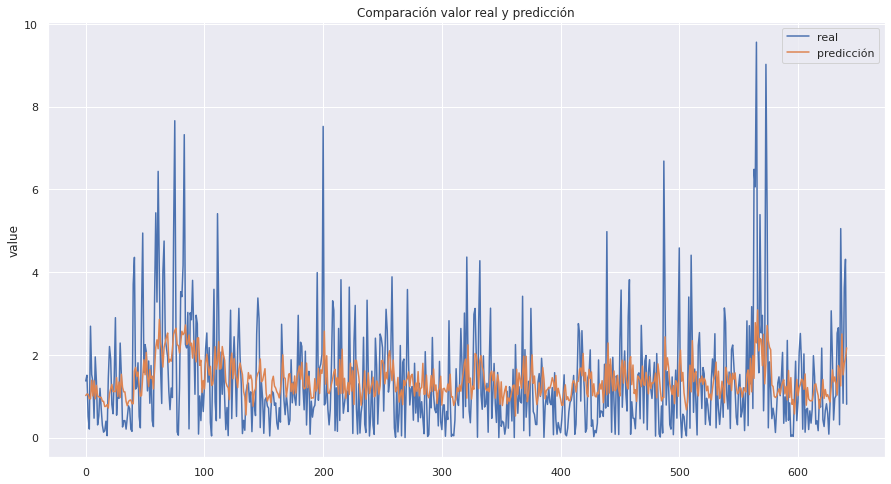

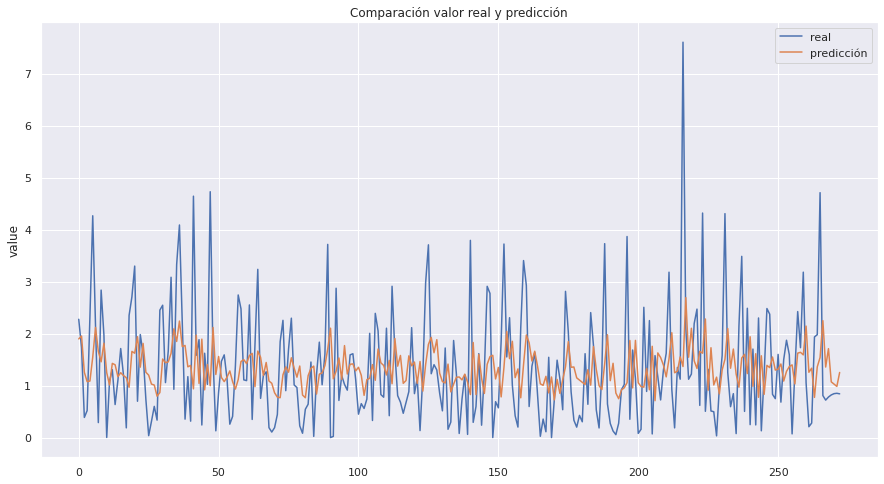

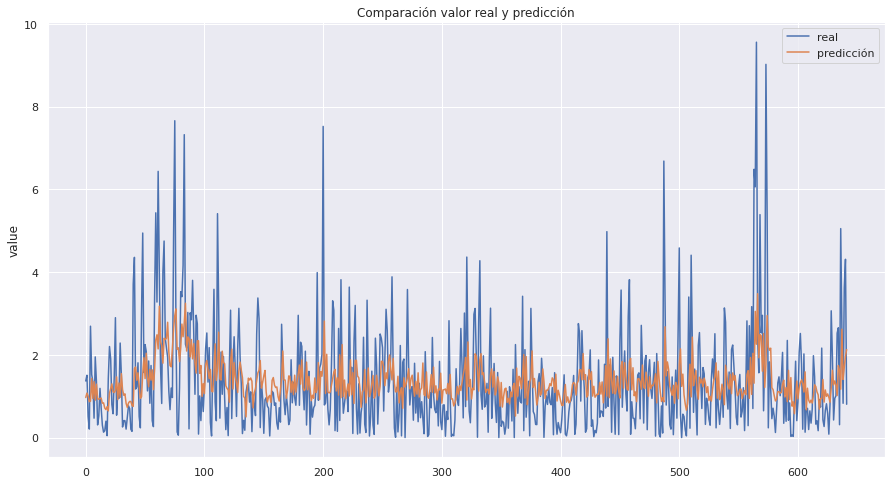

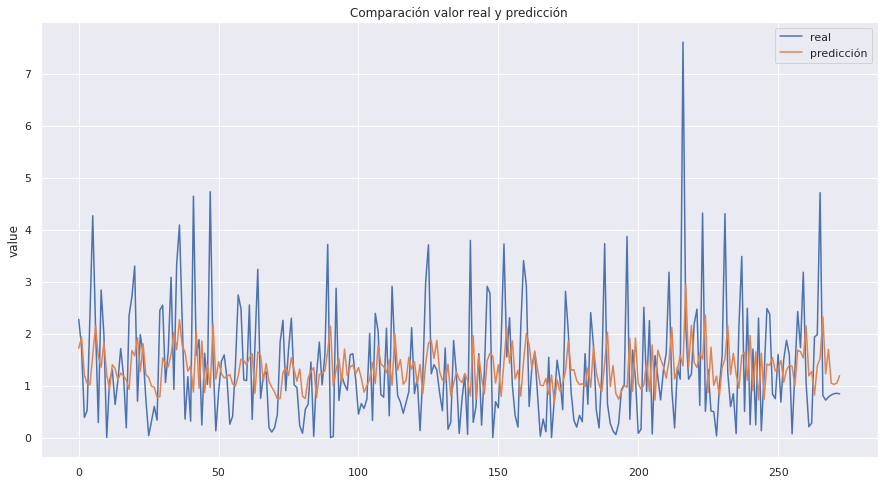

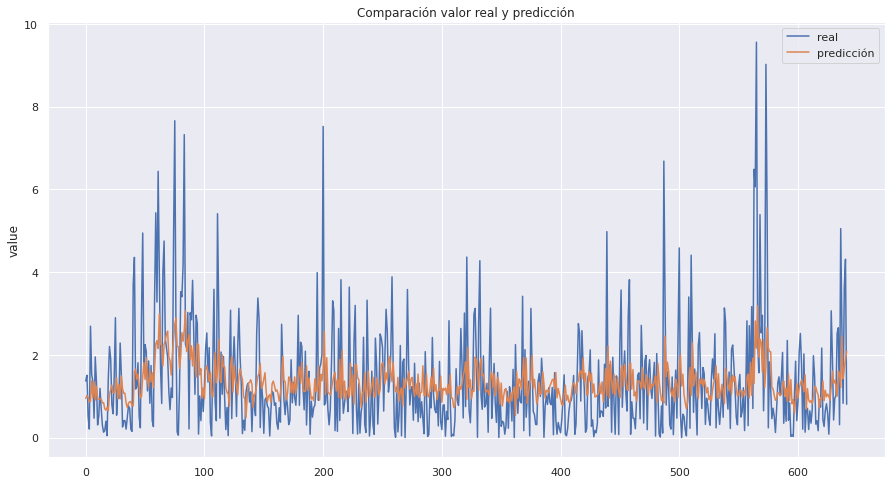

...

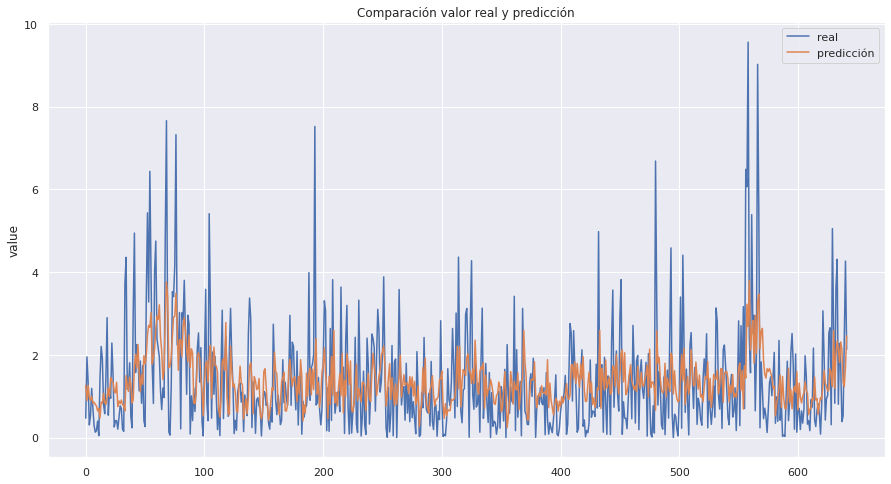

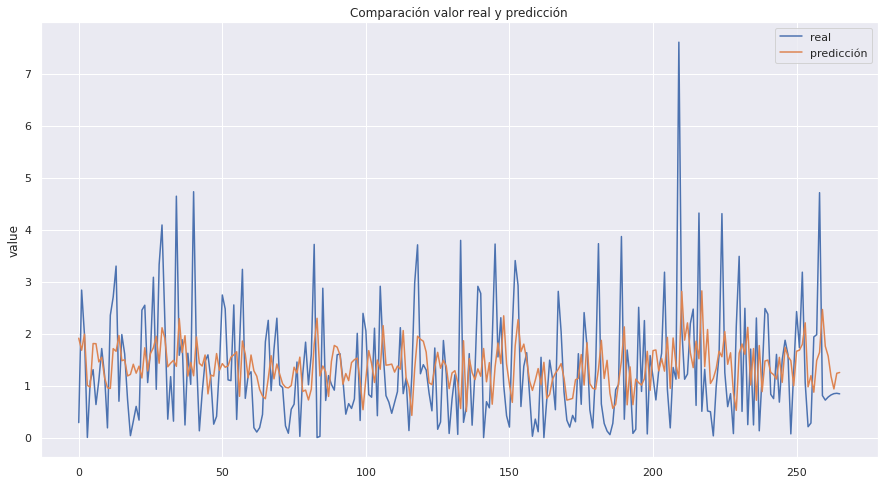

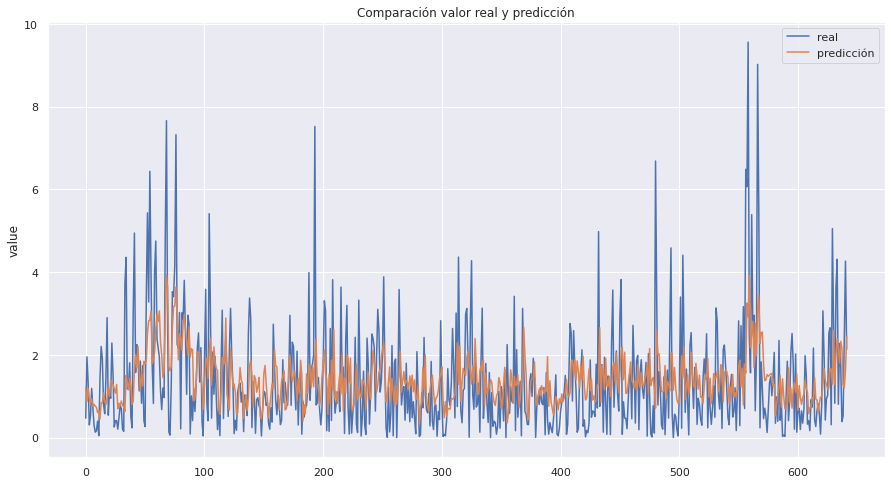

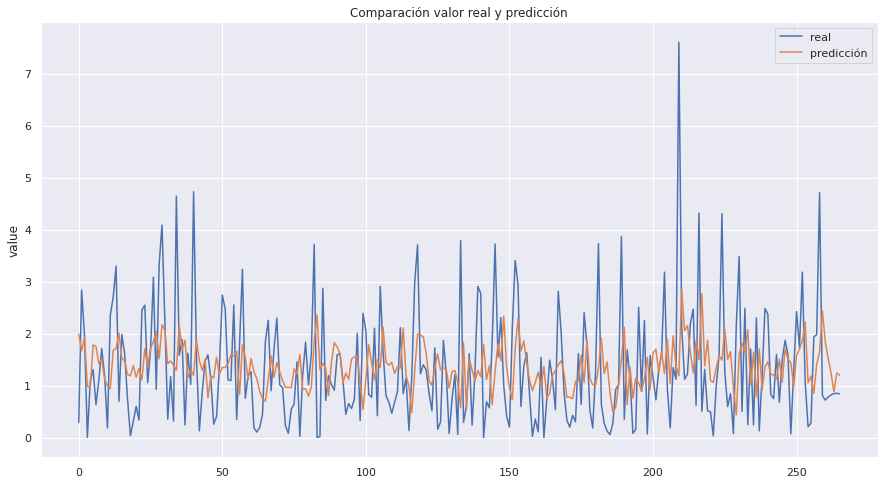

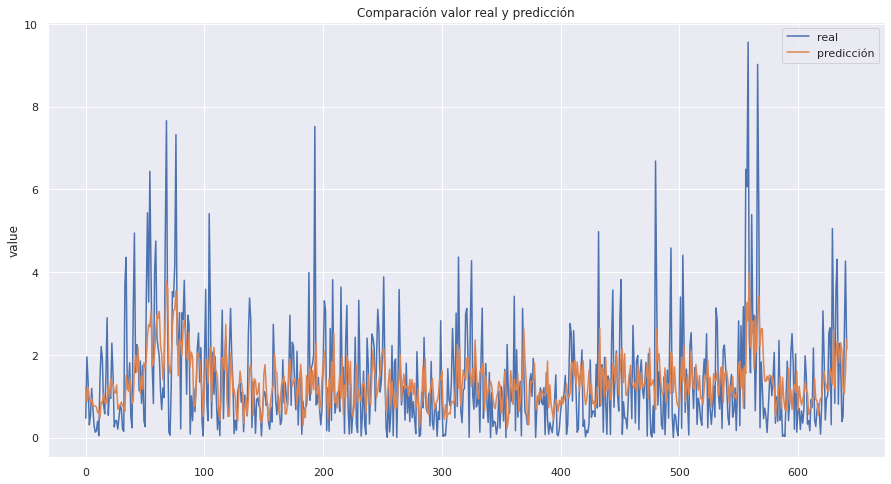

In [ ]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500,2000])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)